# Code

In [1]:
import pandas as pd
from collections import defaultdict

import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from matplotlib.colors import to_hex
from matplotlib import colormaps
from scipy.ndimage import binary_dilation

import torch
import random
from torchvision import transforms
from torchvision.utils import save_image

import os, re, pickle
import nltk

from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_n

In [2]:
def topKcls(dirpath, k=None):
    dir_names = sorted(os.listdir(dirpath)) # ["000" , "001", ...]

    dir2len = defaultdict(int)
    for dir in dir_names:
        dir_path = os.path.join(dirpath, dir)
        dir2len[dir] = len(os.listdir(dir_path))


    dirlen = sorted([(dir, len) for dir, len in dir2len.items()], key = lambda x: -x[1])

    if k is None:
        return {dir : len for dir, len in dirlen}

    return {dir : len for dir, len in dirlen[:k]}


def dir_paths(dir):
    paths = []
    for p in sorted(os.listdir(dir)):
        path = os.path.join(dir, p)
        paths.append(path)
    return paths


def save_data(data, path):
    with open(path, "wb") as f:
        pickle.dump(data, f, protocol=pickle.HIGHEST_PROTOCOL)


def load_data(path):
    with open(path, "rb") as f:
        data = pickle.load(f)

    return data


def recur_mkdir(dir):
    path = dir.split("/")

    if "." in path[-1]: # если в конце пути название файла, например "file.png"
        path = path[:-1]

    for i in range(len(path)):
        cur_dir = "/".join(path[:i+1])

        if not os.path.exists(cur_dir):
            !mkdir "$cur_dir"


def namefile(path):
    return path.split("/")[-1]


def change_ext(path, ext):
    if ext[0] != ".":
        ext = "." + ext
        
    return os.path.splitext(path)[0] + ext


def change_dir_ext(path, new_dir, ext=""):
    if ext != "":
        path = change_ext(path, ext)
    path = path.split("/")
    path[0] = new_dir
    return "/".join(path)


def add2filename(file, number):
    file, ext = os.path.splitext(file)
    file = file + number
    return file + ext


def recur_paths(dir):
    ans = []
    
    for img in os.listdir(dir):
        x = os.path.join(dir, img)
        if os.path.isdir(x):
            ans.extend(recur_paths(x))
        else:
            ans.append(x)
    return ans


def ext_folder(folder):
    onlyfiles = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]

    if len(onlyfiles) == 0:
        print(f"No files if {folder}!!!")

    _, ext = os.path.splitext(onlyfiles[0])
    return ext


def rename_file(folder, name, new_name, ext):

    path = os.path.join(folder, name + ext) 
    new_path = os.path.join(folder, new_name + ext)

    if not os.path.exists(path):
        print(f"Name {path} not exist!!!")
        return

    if os.path.exists(new_path):
        print(f"Newname {new_path} already exist!!!")
        return

    !mv "$path" "$new_path"
    print(f"# {path} -> {new_path}")


def rm_rename_folder(rm_list, rename_dict, folder, ext):
    for i in rm_list:
        path = os.path.join(folder, i + ext)
        !rm "$path"
        print(f"# rm {path}")

    for i in rename_dict:
        path = os.path.join(folder, i + ext)
        new_path = os.path.join(folder, rename_dict[i] + ext)
        if os.path.exists(new_path):
            print(f"{new_path} already exist!!!")
        else:
            !mv "$path" "$new_path"
            print(f"# {path} -> {new_path}")

In [3]:
! which python

/home/natalkaser/mmp/NatalkaPron/venv_name/bin/python


In [4]:
ls

 autors.csv
 autors.ods
 demo.ipynb
 DocEnTR/
 MNIST/
 my_rename.txt
 names1.csv
 names2.csv
 Natalia/
 Natalia.gz
 parsing1.ipynb
 parsing2.ipynb
 Potanin.ipynb
 Small.zip
 strokes_cut/
 Total.zip
 true_rename.txt
'Государственный архив Красноярского края и КККМ.docx'
 КККМ/
 КККМ_bin/
'КККМ_bin(first).zip'
 КККМ_bin.zip
 КККМfolder10_bin.zip
 КККМfolder10_strokes_bin/
 КККМfolder10_strokes_bin.zip
 КККМFOLDER_bin/
 КККМFOLDER_bin.zip
 КККМ_lines/
 КККМ_lines_bin/
 КККМ_lines_bin.zip
 КККМ_lines.zip
 КККМ_myrenamed/
 КККМ_myrenamed.zip
 КККМ_pickles/
 КККМ_pickles.zip
 КККМ_strokes_bin/
 КККМ_strokes_bin.zip
 КККМ.zip


In [5]:
# FOLDER_CLEAR = "КККМ_clear/"
# !rm -r "$FOLDER_CLEAR"
# !unzip КККМ.zip -d "$FOLDER_CLEAR"

# FOLDER_CLEAR = "КККМ_clear/КККМ"

# Extract

In [6]:
# FOLDER_CLEAR = "КККМ_bin"

FOLDER_CLEAR = "КККМ"
ZIP = FOLDER_CLEAR + ".zip"
# !rm -r "$FOLDER_CLEAR"
# !unzip "$ZIP"

In [7]:
EXT = ext_folder(FOLDER_CLEAR)
print(EXT)

.jpeg


# Таблица

In [8]:
df = pd.read_csv('autors.csv')
df = df.to_numpy()
df = df[:, :2]

TABLE_NUM2NAME = {}

for num, name in df:
    
    if isinstance(num, str):
        num = num.strip().split() # по словам
        name = name.strip()
        name = name.replace("\n", " & ")
        
        num = [i for i in num if i[0].isnumeric()]

        # if len(num) != 1:
        #     print(num, name)
        #     break

        num = num[0].replace("/", ":")
        
        # pattern = r"[^а-яА-ЯёЁ]"
        # name = re.sub(pattern, " ", name) # убираем всё, что не русские буквы
        # name = " ".join(name.split())

        if num not in TABLE_NUM2NAME:
            TABLE_NUM2NAME[num] = name
        else:
            print(f"{num} - {name}, but already - {TABLE_NUM2NAME[num]}")
    else:
        print(f"{num} is not str - {name}")

print(TABLE_NUM2NAME["7928:1448"])
TABLE_NUM2NAME["7928:1448"] = "Императорское Русское географическое общество"
print(TABLE_NUM2NAME["7928:2441"])
TABLE_NUM2NAME["7928:2441"] = "Библиотека Императорского вольного экономического общества"

print(len(df))
print(len(TABLE_NUM2NAME))

nan is not str - Адрианов Александр Васильевич
7928:755 - Григорьева П.А., but already - Лосева Е.
7928:1272 - Фарафонтова Таисия Михайловна, but already - Фарафонтова Таисия Михайловна
7928:1530 - Потанин к Новомбергской Вере Алексеевне, but already - Новомбергская Вера Алексеевна
nan is not str - Шашков Серафим Серафимович
Императорское Русского географическое общество
Библиотека императорского вольного экономического общества
2702
2697


In [9]:
set(i.split(":")[0] for i in TABLE_NUM2NAME.keys())

{'10369', '13020', '13233', '3269', '7928', '8400'}

# Переименование картинок

In [10]:
rename_file(FOLDER_CLEAR, "КККМ ОФ 7928:1387Томилов", "КККМ ОФ 7928:1387 Томилов", EXT)
rename_file(FOLDER_CLEAR, "КККМ ОФ 7928:1181", "КККМ ОФ 7928:1181 Соловкин", EXT)

print(len(os.listdir(FOLDER_CLEAR)))

rm_list = ["КККМ ОФ 7928:1404 Начальник СЖД", # печатный текст
           "КККМ ОФ 7928:1404 Общество изучения Сибири", # печатный текст
           "КККМ ОФ 7928:2150 Ржавская.", # копия картинки
           "КККМ ОФ 7928:467 Зверев ", # копия картинки
           ]

rename_dict = {"КККМ ОФ 7928:351 Григорьев В" : "КККМ ОФ 7928:352 Григорьев В",
               "КККМ ОФ 7928:820 М.Ф.М" : "КККМ ОФ 7928:821 М.Ф.М",
               "КККМ ОФ 7928:1670 Кучковская" : "КККМ ОФ 7928:1672 Кучковская",
               "КККМ ОФ 7928:817 Монякова" : "КККМ ОФ 7928:816 Монякова"}

rm_rename_folder(rm_list, rename_dict, FOLDER_CLEAR, EXT)
print(len(os.listdir(FOLDER_CLEAR)))

Name КККМ/КККМ ОФ 7928:1387Томилов.jpeg not exist!!!
Name КККМ/КККМ ОФ 7928:1181.jpeg not exist!!!
2606
rm: cannot remove 'КККМ/КККМ ОФ 7928:1404 Начальник СЖД.jpeg': No such file or directory


# rm КККМ/КККМ ОФ 7928:1404 Начальник СЖД.jpeg
rm: cannot remove 'КККМ/КККМ ОФ 7928:1404 Общество изучения Сибири.jpeg': No such file or directory
# rm КККМ/КККМ ОФ 7928:1404 Общество изучения Сибири.jpeg
rm: cannot remove 'КККМ/КККМ ОФ 7928:2150 Ржавская..jpeg': No such file or directory
# rm КККМ/КККМ ОФ 7928:2150 Ржавская..jpeg
rm: cannot remove 'КККМ/КККМ ОФ 7928:467 Зверев .jpeg': No such file or directory
# rm КККМ/КККМ ОФ 7928:467 Зверев .jpeg
КККМ/КККМ ОФ 7928:352 Григорьев В.jpeg already exist!!!
КККМ/КККМ ОФ 7928:821 М.Ф.М.jpeg already exist!!!
КККМ/КККМ ОФ 7928:1672 Кучковская.jpeg already exist!!!
КККМ/КККМ ОФ 7928:816 Монякова.jpeg already exist!!!
2606


In [11]:
print(len(os.listdir(FOLDER_CLEAR)))

2606


In [12]:
NUM2NAME = {}
list_images = sorted(os.listdir(FOLDER_CLEAR))

for img in list_images:
    if not os.path.isdir(f"{FOLDER_CLEAR}/{img}"):

        img = os.path.splitext(img)[0]
        num, *name = img.strip().split()[2:] # "КККМ", "ОФ" выкинуть
        name = " ".join(name)

        # pattern = r"[^а-яА-ЯёЁ]"
        # name = re.sub(pattern, " ", name) # убираем всё, что не русские буквы
        # name = " ".join(name.split())

        if num not in NUM2NAME:
            NUM2NAME[num] = name
        else:
            print(f"{num} - {name}, but already - {NUM2NAME[num]} - {img}")
    else:
        print(f"{img} is folder")

print("In folder: ", len(list_images))
print("In dict:   ", len(NUM2NAME))

Материалы is folder
Письма Потанина is folder
In folder:  2606
In dict:    2604


In [13]:
set(i.split(":")[0] for i in NUM2NAME.keys())

{'10369', '7928'}

# Анализ авторов

In [14]:
for num in NUM2NAME:
    if num not in TABLE_NUM2NAME:
        print(num, NUM2NAME[num])

print(f"Число строк в таблице: {len(TABLE_NUM2NAME)}\nЧисло изображений: {len(NUM2NAME)}")

Число строк в таблице: 2697
Число изображений: 2604


In [15]:
# в TABLE_NUM2NAME только те картинки, которые есть в NUM2NAME (в папке)
d = {}

for num, name in TABLE_NUM2NAME.items():
    if num in NUM2NAME:
        d[num] = name

TABLE_NUM2NAME = d
print(f"Число строк в таблице, которые есть в папке: {len(TABLE_NUM2NAME)}\nЧисло изображений: {len(NUM2NAME)}")

Число строк в таблице, которые есть в папке: 2604
Число изображений: 2604


In [16]:
TABLE_NAME2NUMS = {}

for num, name in TABLE_NUM2NAME.items():
    if name not in TABLE_NAME2NUMS:
        TABLE_NAME2NUMS[name] = []

    TABLE_NAME2NUMS[name].append(num)

print(f"Число авторов, чьи картинки есть в папке: {len(TABLE_NAME2NUMS)}")
print(f"Число изображений: {sum([len(nums) for nums in TABLE_NAME2NUMS.values()])}")
TABLE_NAME2NUMS = {name : TABLE_NAME2NUMS[name] for name in sorted(TABLE_NAME2NUMS)}

Число авторов, чьи картинки есть в папке: 811
Число изображений: 2604


In [17]:
for name, nums in TABLE_NAME2NUMS.items():
    l = len(nums)

    if l <= 2:
        print(f'"{name:50}" - {l} - {nums}')
    else:
        print(f'"{name:50}" - {l}')

"Агафонов Николай Яковлевич                        " - 1 - ['7928:98']
"Адлер Б.                                          " - 1 - ['7928:1559']
"Адрианов Александр Васильевич                     " - 23
"Адрианова Нина Александровна                      " - 1 - ['7928:57']
"Азанчевский-Азанчеев Всеволод Николаевич          " - 1 - ['7928:2374']
"Акерблом Сергей Иванович                          " - 3
"Акпаев Жакып                                      " - 1 - ['7928:1494']
"Александров П.                                    " - 1 - ['7928:89']
"Алексеевский Владимир Петрович                    " - 1 - ['7928:1419']
"Альджанов (Альжанов) Отыншы (Отунчи)              " - 2 - ['7928:96', '7928:97']
"Андреев В.                                        " - 1 - ['7928:2352']
"Андреев В. & Николаев Н.                          " - 1 - ['7928:2351']
"Андреев Н.                                        " - 2 - ['7928:1408', '7928:1409']
"Андреева Анна                                     " - 1 - ['7928:

In [18]:

for name, nums in TABLE_NAME2NUMS.items():

    name2nums = defaultdict(list)

    for num in nums:
        name2nums[NUM2NAME[num]].append(num)

    nums_names_single = " | ".join([f"{name}: {", ".join(nums)}" for name, nums in name2nums.items()])

    print(f'"{name:70}" -  {len(name2nums)} - {nums_names_single}')

"Агафонов Николай Яковлевич                                            " -  1 - Агафонов: 7928:98
"Адлер Б.                                                              " -  1 - Адлер: 7928:1559
"Адрианов Александр Васильевич                                         " -  1 - Адрианов: 7928:44, 7928:45, 7928:46, 7928:47, 7928:48, 7928:49, 7928:50, 7928:51, 7928:52, 7928:53, 7928:54, 7928:55, 7928:56, 7928:1562, 7928:1563, 7928:1564, 7928:1565, 7928:1566, 7928:1567, 7928:1568, 7928:1569, 7928:1570, 7928:1571
"Адрианова Нина Александровна                                          " -  1 - Адрианова: 7928:57
"Азанчевский-Азанчеев Всеволод Николаевич                              " -  1 - Азанчевский: 7928:2374
"Акерблом Сергей Иванович                                              " -  1 - Акерблом: 7928:64, 7928:65, 7928:66
"Акпаев Жакып                                                          " -  1 - Акпаев: 7928:1494
"Александров П.                                                        " 

In [20]:
table = np.full((10 * len(TABLE_NAME2NUMS), 5), "-", dtype=object)

i = 0
for name, nums in TABLE_NAME2NUMS.items():
    
    name2nums = defaultdict(list)

    for num in nums:
        name2nums[NUM2NAME[num]].append(num)


    table[i][0] = name
    table[i][1] = len(nums)
    table[i][2] = len(name2nums)

    for name, nums in name2nums.items():
        table[i][3] = name
        table[i][4] = ", ".join(nums)
        i += 1

In [21]:
names_table = ["Имя", "Число изображений", "Количество вариантов имён", "Варианты имён", "Картинки "]

print(len(names_table))

d = {names_table[i] : table[:, i] for i in range(len(names_table))}

print(len(d))

df = pd.DataFrame(d)

df.to_csv("names1.csv", index=False)

5
5


In [22]:
# сортировка по количеству авторов

for name in sorted(TABLE_NAME2NUMS, key = lambda x: -len(TABLE_NAME2NUMS[x])):
    nums = TABLE_NAME2NUMS[name]
    l = len(nums)

    if l <= 2:
        print(f'"{name:50}" - {l} - {nums}')
    else:
        print(f'"{name:50}" - {l}')

"Фарафонтова Таисия Михайловна                     " - 67
"Потанина Александра Викторовна                    " - 62
"Ивановский Алексей Осипович                       " - 48
"Крутовский Владимир Михайлович                    " - 46
"Яковлева Евдокия Егоровна / Григорьевна           " - 40
"Неустановленное лицо                              " - 36
"Свентицкая Мария Хрисанфовна                      " - 35
"Вагнер (Дзвонкевич) Екатерина Николаевна          " - 32
"Антонова Валентина Константиновна                 " - 31
"Проскурякова Е. Павловна                          " - 30
"Семидалов Вениамин Иванович                       " - 30
"Крутовская Лидия Симоновна                        " - 29
"Мендельсон Николай Михайлович                     " - 29
"Ржавская Надежда Федоровна                        " - 28
"Попов Иван Иванович                               " - 25
"Серошевский Вацлав Леопольдович                   " - 25
"Адрианов Александр Васильевич                     " - 23
"Анучин Дмитри

# С несколькими авторами

In [24]:
TABLE_SINGLESNAME2NUMS = {} # name -> {"single" : [], "multiple" : []}

for name, nums in TABLE_NAME2NUMS.items():
    names = name.split(" & ")
    
    single = len(names) == 1

    for name in names:
        if name not in TABLE_SINGLESNAME2NUMS:
            TABLE_SINGLESNAME2NUMS[name] = {"single" : [], "multiple" : []}

        key = "single" if single else "multiple"
        TABLE_SINGLESNAME2NUMS[name][key].extend(nums)

TABLE_SINGLESNAME2NUMS = {name : TABLE_SINGLESNAME2NUMS[name] for name in sorted(TABLE_SINGLESNAME2NUMS)}
print(f"Число авторов: {len(TABLE_SINGLESNAME2NUMS)}")
print(f"Число изображений: {sum([len(nums["single"]) + len(nums["multiple"]) for nums in TABLE_SINGLESNAME2NUMS.values()])}")

l = set()
for name, sin_mul in TABLE_SINGLESNAME2NUMS.items():
    l.update(sin_mul["single"])
    l.update(sin_mul["multiple"])

print(f"Число изображений без повторов: {len(l)}")

Число авторов: 839
Число изображений: 2750
Число изображений без повторов: 2604


In [25]:
TABLE_NUM2NAME["7928:614"], NUM2NAME["7928:614"]

('Потанина Александра Викторовна', 'Лаврская А')

In [26]:
from collections import defaultdict

for name, sin_mul in TABLE_SINGLESNAME2NUMS.items():
    single, multiple = sin_mul["single"], sin_mul["multiple"]
    l1 = len(single)
    l2 = len(multiple)

    # image_names_single = set(NUM2NAME[num] for num in single)
    # image_names_multiple = set(NUM2NAME[num] for num in multiple)

    # single_name2nums = {NUM2NAME[num] : num for num in single}
    # multiple_name2nums = {NUM2NAME[num] : num for num in multiple}

    single_name2nums = defaultdict(list)
    multiple_name2nums = defaultdict(list)

    for num in single:
        single_name2nums[NUM2NAME[num]].append(num)

    for num in multiple:
        multiple_name2nums[NUM2NAME[num]].append(num)

    nums_names_single = " | ".join([f"{name}: {", ".join(nums)}" for name, nums in single_name2nums.items()])
    nums_names_multiple = " | ".join([f"{name}: {", ".join(nums)}" for name, nums in multiple_name2nums.items()])


    # sep = " + " if (len(image_names_single) * len(image_names_single) > 0) else ""
    # image_names = " | ".join(image_names_single) + (" + " if (len(image_names_single) * len(image_names_multiple) > 0) else "") + " | ".join(image_names_multiple)

    # nums_names_single = " | ".join([f"{name} - {single}" for single, name in zip(single, image_names_single)])
    # nums_names_multiple = " | ".join([f"{name} - {single}" for single, name in zip(multiple, image_names_multiple)])

    sep = "   +   " if l1 * l2 > 0 else ""

    print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_single}{sep}{nums_names_multiple}')

    # if l1 == 0:
    #     print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_multiple}')
    # elif l2 == 0:
    #     if l1 <= 2:
    #         print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_single}')
    #     else:
    #         print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_single}')
    # else: # l2 != 0
    #     if l1 <= 2:
    #         print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_single}   +   {nums_names_multiple}')
    #     else:
    #         print(f'"{name:70}" -  {l1:2} + {l2} - {nums_names_multiple}')

"Агафонов Николай Яковлевич                                            " -   1 + 0 - Агафонов: 7928:98
"Адлер Б.                                                              " -   1 + 0 - Адлер: 7928:1559
"Адрианов Александр Васильевич                                         " -  23 + 0 - Адрианов: 7928:44, 7928:45, 7928:46, 7928:47, 7928:48, 7928:49, 7928:50, 7928:51, 7928:52, 7928:53, 7928:54, 7928:55, 7928:56, 7928:1562, 7928:1563, 7928:1564, 7928:1565, 7928:1566, 7928:1567, 7928:1568, 7928:1569, 7928:1570, 7928:1571
"Адрианова Нина Александровна                                          " -   1 + 0 - Адрианова: 7928:57
"Азанчевский-Азанчеев Всеволод Николаевич                              " -   1 + 0 - Азанчевский: 7928:2374
"Акерблом Сергей Иванович                                              " -   3 + 0 - Акерблом: 7928:64, 7928:65, 7928:66
"Акпаев Жакып                                                          " -   1 + 0 - Акпаев: 7928:1494
"Александров П.                       

In [27]:
table = np.full((10 * len(TABLE_SINGLESNAME2NUMS), 9), "-", dtype=object)

i = 0
for name, sin_mul in TABLE_SINGLESNAME2NUMS.items():
    single, multiple = sin_mul["single"], sin_mul["multiple"]
    l1 = len(single)
    l2 = len(multiple)

    # image_names_single = set(NUM2NAME[num] for num in single)
    # image_names_multiple = set(NUM2NAME[num] for num in multiple)

    # single_name2nums = {NUM2NAME[num] : num for num in single}
    # multiple_name2nums = {NUM2NAME[num] : num for num in multiple}

    single_name2nums = defaultdict(list)
    multiple_name2nums = defaultdict(list)

    for num in single:
        single_name2nums[NUM2NAME[num]].append(num)

    for num in multiple:
        multiple_name2nums[NUM2NAME[num]].append(num)

    table[i][0] = name
    table[i][1] = l1
    table[i][2] = l2
    table[i][3] = len(single_name2nums)
    table[i][4] = len(multiple_name2nums)

    k1 = i
    for name, nums in single_name2nums.items():
        table[k1][5] = name
        table[k1][6] = ", ".join(nums)
        k1 += 1

    k2 = i
    for name, nums in multiple_name2nums.items():
        table[k2][7] = name
        table[k2][8] = ", ".join(nums)
        k2 += 1

    # print(table[i])

    i = max(k1, k2)

In [28]:
i = 0
table[i], len(table[i])

(array(['Агафонов Николай Яковлевич', 1, 0, 1, 0, 'Агафонов', '7928:98',
        '-', '-'], dtype=object),
 9)

In [29]:
names_table = ["Имя", "С единственным автором", "В соавторстве", 
               "Количество вариантов имён (single)", "Количество вариантов имён (multiple)",
               "Варианты имён (single)", "Картинки (single)", "Варианты имён (multiple)", "Картинки (multiple)"]

print(len(names_table))

d = {names_table[i] : table[:, i] for i in range(len(names_table))}

print(len(d))

df = pd.DataFrame(d)

df.to_csv("names2.csv", index=False)

9
9


# Обработка бинаризованного

In [86]:
ls

 autors.csv       true_rename.txt
 autors.ods      'Государственный архив Красноярского края и КККМ.docx'
 demo.ipynb       КККМ/
 DocEnTR/         КККМ_bin/
 logs/           'КККМ_bin(first).zip'
 MNIST/           КККМ_bin.zip
 my_rename.txt    КККМFOLDER_bin.zip
 names1.csv       КККМ_lines/
 names2.csv       КККМ_lines.zip
 Natalia/         КККМ_myrenamed/
 Natalia.gz       КККМ_myrenamed.zip
 parsing1.ipynb   КККМ_pickles/
 parsing2.ipynb   КККМ_pickles.zip
 Potanin.ipynb    КККМ.zip
 strokes_cut/


In [87]:
FOLDER = "КККМ/"
FOLDER_BIN = "КККМ_bin/"

!rm -r "$FOLDER_BIN"
!unzip КККМ_bin.zip -d "."

Archive:  КККМ_bin.zip
   creating: ./КККМ_bin/
  inflating: ./КККМ_bin/КККМ ОФ 7928:2200 Сыромятников.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2185 Руднев.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2197 Стукачева.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2199 Свентицкая.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2198 Лаврский, Свентицкая, Тейтель.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2157 Рыбалкин.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2201 Солдатенко.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2196 Стукачева.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2159 Росляков.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2203 Сапожников.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:219 Воронов.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:221 Василевский В.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2165 Раппопорт.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2250 Тютрюмова Ф.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2229 Бондаревская.png  
  inflating: ./КККМ_bin/КККМ ОФ 7928:2214 Серебренников.

In [88]:
print(len(os.listdir(FOLDER)), len(os.listdir(FOLDER_BIN)))

EXT = ext_folder(FOLDER_BIN)
print(EXT)

rename_file(FOLDER_BIN, "КККМ ОФ 7928:1387Томилов", "КККМ ОФ 7928:1387 Томилов", EXT)
rename_file(FOLDER_BIN, "КККМ ОФ 7928:1181", "КККМ ОФ 7928:1181 Соловкин", EXT)

rm_list = ["КККМ ОФ 7928:1404 Начальник СЖД", # печатный текст
           "КККМ ОФ 7928:1404 Общество изучения Сибири", # печатный текст
           "КККМ ОФ 7928:2150 Ржавская.", # копия картинки
           "КККМ ОФ 7928:467 Зверев ", # копия картинки
           ]

rename_dict = {"КККМ ОФ 7928:351 Григорьев В" : "КККМ ОФ 7928:352 Григорьев В",
               "КККМ ОФ 7928:820 М.Ф.М" : "КККМ ОФ 7928:821 М.Ф.М",
               "КККМ ОФ 7928:1670 Кучковская" : "КККМ ОФ 7928:1672 Кучковская",
               "КККМ ОФ 7928:817 Монякова" : "КККМ ОФ 7928:816 Монякова"}

rm_rename_folder(rm_list, rename_dict, FOLDER_BIN, EXT)
print(len(os.listdir(FOLDER)), len(os.listdir(FOLDER_BIN)))

2606 2606
.png
Name КККМ_bin/КККМ ОФ 7928:1387Томилов.png not exist!!!
Name КККМ_bin/КККМ ОФ 7928:1181.png not exist!!!
rm: cannot remove 'КККМ_bin/КККМ ОФ 7928:1404 Начальник СЖД.png': No such file or directory
# rm КККМ_bin/КККМ ОФ 7928:1404 Начальник СЖД.png
rm: cannot remove 'КККМ_bin/КККМ ОФ 7928:1404 Общество изучения Сибири.png': No such file or directory
# rm КККМ_bin/КККМ ОФ 7928:1404 Общество изучения Сибири.png
rm: cannot remove 'КККМ_bin/КККМ ОФ 7928:2150 Ржавская..png': No such file or directory
# rm КККМ_bin/КККМ ОФ 7928:2150 Ржавская..png
rm: cannot remove 'КККМ_bin/КККМ ОФ 7928:467 Зверев .png': No such file or directory
# rm КККМ_bin/КККМ ОФ 7928:467 Зверев .png
КККМ_bin/КККМ ОФ 7928:352 Григорьев В.png already exist!!!
КККМ_bin/КККМ ОФ 7928:821 М.Ф.М.png already exist!!!
КККМ_bin/КККМ ОФ 7928:1672 Кучковская.png already exist!!!
КККМ_bin/КККМ ОФ 7928:816 Монякова.png already exist!!!
2606 2606


In [89]:
# recur_paths(FOLDER)
len(recur_paths(FOLDER)), len(recur_paths(FOLDER_BIN))

(2650, 2650)

In [90]:
# def replace_letter_in_names(folder, old_letter, new_letter):
#     for file in sorted(recur_paths(folder)):
#         path = file
#         new_path = file.replace(old_letter, new_letter)

#         if new_path != path:
#             print(f"Changed {old_letter} in '{path}'")
#             !mv "$path" "$new_path"

# OK_N = "й"
# NOTOK_N = "й"
# print(OK_N, NOTOK_N, OK_N == NOTOK_N, ord(OK_N), len(NOTOK_N))
# replace_letter_in_names(FOLDER_BIN, NOTOK_N, OK_N)


# OK_E = "ё"
# NOTOK_E = "ё"
# print(OK_E, NOTOK_E, OK_E == NOTOK_E, ord(OK_E), len(NOTOK_E))
# replace_letter_in_names(FOLDER_BIN, NOTOK_E, OK_E)

In [52]:
# Создание папок "Материалы" и "Письма Потанина" в FOLDER_BIN

for file in sorted(recur_paths(FOLDER)):
    
    name, ext = os.path.splitext(file)

    path = name.split("/")

    if "Материалы" in name or "Письма Потанина" in name:
        folder, d, name = path

        new_path = os.path.join(FOLDER_BIN, d)

        if not os.path.exists(new_path):
            print(f"Make {new_path}")
            !mkdir "$new_path"

        new_path = os.path.join(FOLDER_BIN, d, f"{name}.png")
        path = os.path.join(FOLDER_BIN, f"{name}.png")
        if not os.path.exists(path):
            print(f"Where {path}???")
        
        print(f"{path} -> {new_path}")
        !mv "$path" "$new_path"

    else:
        folder, name = path
        path = os.path.join(FOLDER_BIN, f"{name}.png")
        if not os.path.exists(path):
            print(f"Where {path} ???")


Make КККМ_bin/Материалы
КККМ_bin/В Департамент полиции КККМ ОФ 7928:2.png -> КККМ_bin/Материалы/В Департамент полиции КККМ ОФ 7928:2.png
КККМ_bin/В Томскую полицию КККМ ОФ 7928:1.png -> КККМ_bin/Материалы/В Томскую полицию КККМ ОФ 7928:1.png
КККМ_bin/Диплом Енисейского Общества попечения о народном образовании КПД 3693.png -> КККМ_bin/Материалы/Диплом Енисейского Общества попечения о народном образовании КПД 3693.png
КККМ_bin/Заметки КККМ ОФ 7928:4.png -> КККМ_bin/Материалы/Заметки КККМ ОФ 7928:4.png
КККМ_bin/Запрос в полицию КККМ ОФ 7928:2658 .png -> КККМ_bin/Материалы/Запрос в полицию КККМ ОФ 7928:2658 .png
КККМ_bin/Опись пакета КККМ ОФ 7928:1438.png -> КККМ_bin/Материалы/Опись пакета КККМ ОФ 7928:1438.png
КККМ_bin/Перечень книг КККМ ОФ 7928:8.png -> КККМ_bin/Материалы/Перечень книг КККМ ОФ 7928:8.png
КККМ_bin/Послужной список КККМ ОФ 7928:1445.png -> КККМ_bin/Материалы/Послужной список КККМ ОФ 7928:1445.png
КККМ_bin/Послужной список КККМ ОФ 7928:1446.png -> КККМ_bin/Материалы/Послуж

In [91]:
print(len(os.listdir(FOLDER)), len(os.listdir(FOLDER_BIN)))

2606 2606


In [92]:
for file1, file2 in tqdm(zip(sorted(recur_paths(FOLDER)), 
                        sorted(recur_paths(FOLDER_BIN)))):
    
    file1, _ = os.path.splitext(file1) # без ext
    file2, _ = os.path.splitext(file2)

    file1 = file1.split("/")[1:] # без названия папки (КККМ)
    file2 = file2.split("/")[1:]

    if file1 != file2:
        print(file1, file2)

2650it [00:00, 290638.96it/s]


# Удаление цветных пикселей у бинарного

In [93]:
# i = 0
# image, cls = dataset[0]
# image = image.permute(1, 2, 0).numpy()
# print(image.shape)
# plt.imshow(image)
# plt.grid(False)

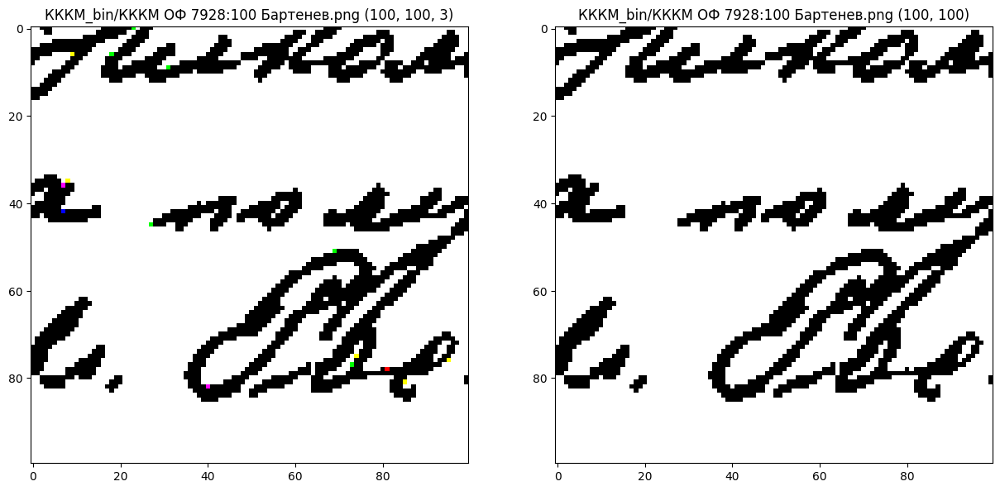

In [56]:
file = sorted(recur_paths(FOLDER_BIN))[1]

image = Image.open(file)#.convert("RGB")
# image = self.transform(image)
np_image = np.array(image) [200:300, 200:300]

plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.title(f"{file} {np_image.shape}")
plt.imshow(np_image)

np_image = np.array(image).max(axis=-1) [200:300, 200:300]
plt.subplot(1, 2, 2)
plt.title(f"{file} {np_image.shape}")
plt.imshow(np_image, cmap="gray")
# plt.grid(False)
# plt.axis(False)

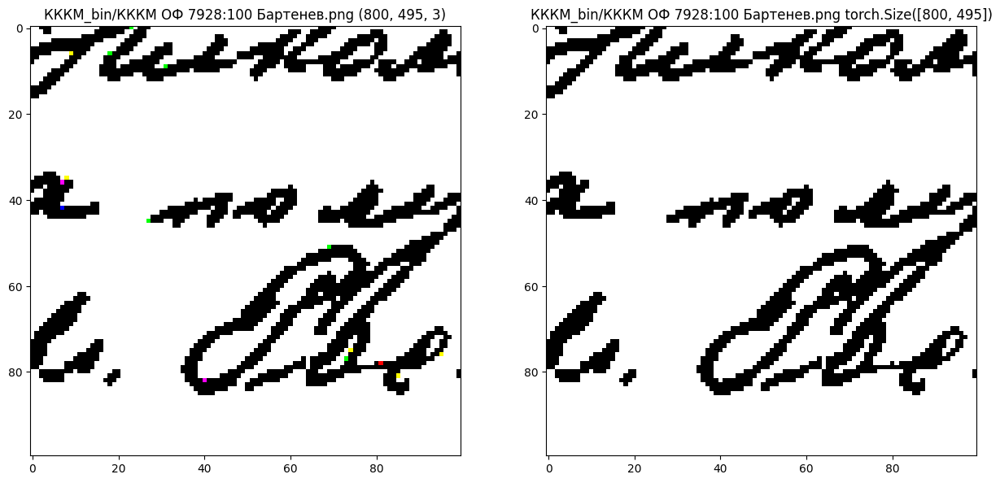

In [57]:
# for file in sorted(recur_paths(FOLDER_BIN)):
file = sorted(recur_paths(FOLDER_BIN))[1]

image = Image.open(file).convert("RGB")
tr_image = transforms.ToTensor()(image).max(dim=0).values
# print(tr_image.shape)
np_image = np.array(image)

plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.title(f"{file} {np_image.shape}")
plt.imshow(np_image[200:300, 200:300])

plt.subplot(1, 2, 2)
plt.title(f"{file} {tr_image.shape}")
plt.imshow(tr_image[200:300, 200:300], cmap="gray")
# plt.grid(False)
# plt.axis(False)

In [ ]:
# 2 652 items, totalling 87,6 MB -> 2 652 items, totalling 58,7 MB

print(len(recur_paths(FOLDER_BIN)))

for file in tqdm(sorted(recur_paths(FOLDER_BIN))):
    
    image = Image.open(file).convert("RGB")
    tr_image = transforms.ToTensor()(image).max(dim=0).values
    !rm "{file}"
    save_image(tr_image, file)

print(len(recur_paths(FOLDER_BIN)))

2650


  0%|                                                  | 0/2650 [00:00<?, ?it/s]

100%|███████████████████████████████████████| 2650/2650 [10:26<00:00,  4.23it/s]

2650


# Бинаризованные в ImageFolder

In [ ]:
print(f"Число строк в таблице, которые есть в папке: {len(TABLE_NUM2NAME)}")
print(f"Число изображений: {len(NUM2NAME)}")

print(f"Число авторов, чьи картинки есть в папке: {len(TABLE_NAME2NUMS)}")
print(f"Число изображений: {sum([len(nums) for nums in TABLE_NAME2NUMS.values()])}")

Число строк в таблице, которые есть в папке: 2604
Число изображений: 2604
Число авторов, чьи картинки есть в папке: 811
Число изображений: 2604


In [27]:
FOLDER_from= "КККМ_bin"
FOLDER_to= "КККМFOLDER_bin"

!rm -r "$FOLDER_to"
!mkdir "$FOLDER_to"

for name, nums in TABLE_NAME2NUMS.items():

    dir_to = os.path.join(FOLDER_to, name)
    if not os.path.exists(dir_to):
        !mkdir "$dir_to"
    if not os.path.exists(dir_to):
        continue

    for num in nums:
        image_name = NUM2NAME[num]

        if len(image_name) != 0: # существуют image_name = ""
            image_name = " " + image_name

        path = os.path.join(FOLDER_from, f"КККМ ОФ {num}{image_name}.png")
        new_path =  os.path.join(dir_to, f"КККМ ОФ {num}{image_name}.png")

        if not os.path.exists(path):
            print(f"Name {path} not exist!!!")
            continue

        if os.path.exists(new_path):
            print(f"Newname {new_path} already exist!!!")
            continue

        !cp "$path" "$new_path"

rm: cannot remove 'КККМFOLDER_bin': No such file or directory
mkdir: cannot create directory ‘КККМFOLDER_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long
mkdir: cannot create directory ‘КККМFOLDER_bin/Гаршниева М. / Баршниева М.’: No such file or directory
mkdir: cannot create directory ‘КККМFOLDER_bin/Иннокентий Ману… / Молчанов?’: No such file or directory
mkdir: cannot create directory ‘КККМFOLDER_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long
mkdir: cannot create directory ‘КККМFOLDER_bin/Клич/Кляв И.’: No such file or directory
mkdir: cannot create directory ‘КККМFOLDER_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лук

In [33]:
len(recur_paths(FOLDER_from)), len(recur_paths(FOLDER_to)), len(os.listdir(FOLDER_to))

(2650, 2551, 803)

In [28]:
!zip -r "{FOLDER_to}.zip" "{FOLDER_to}"

updating: КККМFOLDER_bin/ (stored 0%)
updating: КККМFOLDER_bin/Васильева-Потанина Мария Георгиевна/ (stored 0%)
updating: КККМFOLDER_bin/Васильева-Потанина Мария Георгиевна/КККМ ОФ 7928:1516 Васильева.png (deflated 5%)
updating: КККМFOLDER_bin/Ляпустин А./ (stored 0%)
updating: КККМFOLDER_bin/Ляпустин А./КККМ ОФ 7928:1963 Ляпустин.png (deflated 5%)
updating: КККМFOLDER_bin/Бабанина Елена/ (stored 0%)
updating: КККМFOLDER_bin/Бабанина Елена/КККМ ОФ 7928:214 Бабанина.png (deflated 1%)
updating: КККМFOLDER_bin/Бабанина Елена/КККМ ОФ 7928:215 Бабанина.png (deflated 0%)
updating: КККМFOLDER_bin/Бабанина Елена/КККМ ОФ 7928:1582 Бабанина.png (deflated 6%)
updating: КККМFOLDER_bin/Мокиевская & Мокиевский П. & Выхарева & Юферова & Лихарева/ (stored 0%)
updating: КККМFOLDER_bin/Мокиевская & Мокиевский П. & Выхарева & Юферова & Лихарева/КККМ ОФ 7928:1485 Мокиевские и др.png (deflated 5%)
updating: КККМFOLDER_bin/Управляющий фабрики в с. Колыванское/ (stored 0%)
updating: КККМFOLDER_bin/Управляющи

In [34]:
FOLDER_from= "КККМFOLDER_bin"
FOLDER_to= "КККМfolder10_bin"

!rm -r "$FOLDER_to"
!mkdir "$FOLDER_to"


dir_names = sorted(os.listdir(FOLDER_from)) # ["000" , "001", ...]

dir2len = defaultdict(int)

for dir in dir_names:
    dir_path = os.path.join(FOLDER_from, dir)
    dir2len[dir] = len(os.listdir(dir_path))
        

dirlen = sorted([(dir, len) for dir, len in dir2len.items()], key = lambda x: -x[1])
topk_dir2len = dirlen[:10]
topk_dir2len = {dir : len for dir, len in topk_dir2len}


for dir in topk_dir2len:
    path = os.path.join(FOLDER_from, dir)
    new_path = os.path.join(FOLDER_to, dir)
    !cp -r "{path}" "{new_path}"

rm: cannot remove 'КККМfolder10_bin': No such file or directory


In [35]:
topk_dir2len

{'Фарафонтова Таисия Михайловна': 67,
 'Потанина Александра Викторовна': 62,
 'Ивановский Алексей Осипович': 48,
 'Крутовский Владимир Михайлович': 46,
 'Неустановленное лицо': 36,
 'Свентицкая Мария Хрисанфовна': 35,
 'Вагнер (Дзвонкевич) Екатерина Николаевна': 32,
 'Антонова Валентина Константиновна': 31,
 'Проскурякова Е. Павловна': 30,
 'Семидалов Вениамин Иванович': 30}

# Нарезка строк (КККМ_strokes_bin, КККМ_lines_bin)

In [7]:
ls

 autors.csv       'Государственный архив Красноярского края и КККМ.docx'
 autors.ods        КККМ/
 demo.ipynb        КККМ_bin/
 DocEnTR/         'КККМ_bin(first).zip'
 logs/             КККМ_bin.zip
 MNIST/            КККМFOLDER_bin.zip
 my_rename.txt     КККМ_lines/
 names1.csv        КККМ_lines_bin/
 names2.csv        КККМ_lines.zip
 Natalia/          КККМ_myrenamed/
 Natalia.gz        КККМ_myrenamed.zip
 parsing1.ipynb    КККМ_pickles/
 parsing2.ipynb    КККМ_pickles.zip
 Potanin.ipynb     КККМ_strokes_bin/
 strokes_cut/      КККМ.zip
 true_rename.txt


In [8]:
FOLDER_BIN = "КККМ_bin"
FOLDER_LINES = "КККМ_lines"
FOLDER_PICKLES = "КККМ_pickles"

FOLDER_STROKES_BIN= "КККМ_strokes_bin"
FOLDER_LINES_BIN= "КККМ_lines_bin"

!rm -r "$FOLDER_STROKES_BIN"
!rm -r "$FOLDER_LINES_BIN"

# !rm -r "$FOLDER_LINES"
# !unzip "{FOLDER_LINES}.zip" -d "."

# !rm -r "$FOLDER_PICKLES"
# !unzip "{FOLDER_PICKLES}.zip" -d "."

In [9]:
# rm_list = ["КККМ ОФ 7928:1404 Начальник СЖД", # печатный текст
#            "КККМ ОФ 7928:1404 Общество изучения Сибири", # печатный текст
#            "КККМ ОФ 7928:2150 Ржавская.", # копия картинки
#            "КККМ ОФ 7928:467 Зверев ", # копия картинки
#            ]

# rename_dict = {"КККМ ОФ 7928:351 Григорьев В" : "КККМ ОФ 7928:352 Григорьев В",
#                "КККМ ОФ 7928:820 М.Ф.М" : "КККМ ОФ 7928:821 М.Ф.М",
#                "КККМ ОФ 7928:1670 Кучковская" : "КККМ ОФ 7928:1672 Кучковская",
#                "КККМ ОФ 7928:817 Монякова" : "КККМ ОФ 7928:816 Монякова"}

# print(len(os.listdir(FOLDER_LINES)), len(os.listdir(FOLDER_PICKLES)))

# EXT = ext_folder(FOLDER_LINES)
# print(EXT)
# rename_file(FOLDER_LINES, "КККМ ОФ 7928:1387Томилов", "КККМ ОФ 7928:1387 Томилов", EXT)
# rename_file(FOLDER_LINES, "КККМ ОФ 7928:1181", "КККМ ОФ 7928:1181 Соловкин", EXT)
# rm_rename_folder(rm_list, rename_dict, FOLDER_LINES, EXT)

# EXT = ext_folder(FOLDER_PICKLES)
# print(EXT)
# rename_file(FOLDER_PICKLES, "КККМ ОФ 7928:1387Томилов", "КККМ ОФ 7928:1387 Томилов", EXT)
# rename_file(FOLDER_PICKLES, "КККМ ОФ 7928:1181", "КККМ ОФ 7928:1181 Соловкин", EXT)
# rm_rename_folder(rm_list, rename_dict, FOLDER_PICKLES, EXT)

# print(len(os.listdir(FOLDER_LINES)), len(os.listdir(FOLDER_PICKLES)))


In [10]:
print(len(os.listdir(FOLDER_BIN)), len(os.listdir(FOLDER_LINES)), len(os.listdir(FOLDER_PICKLES)))

2606 2606 2606


In [11]:
print(len(recur_paths(FOLDER_BIN)), len(recur_paths(FOLDER_LINES)), len(recur_paths(FOLDER_PICKLES)))

2650 2650 2650


In [12]:
for file1, file2 in tqdm(zip(sorted(recur_paths(FOLDER_BIN)), 
                        sorted(recur_paths(FOLDER_LINES)))):
    
    file1, _ = os.path.splitext(file1) # без ext
    file2, _ = os.path.splitext(file2)

    file1 = file1.split("/")[1:] # без названия папки (КККМ)
    file2 = file2.split("/")[1:]

    if file1 != file2:
        print(file1, file2)

0it [00:00, ?it/s]

2650it [00:00, 59441.18it/s]


In [13]:
for file1, file2 in tqdm(zip(sorted(recur_paths(FOLDER_BIN)), 
                        sorted(recur_paths(FOLDER_PICKLES)))):
    
    file1, _ = os.path.splitext(file1) # без ext
    file2, _ = os.path.splitext(file2)

    file1 = file1.split("/")[1:] # без названия папки (КККМ)
    file2 = file2.split("/")[1:]

    if file1 != file2:
        print(file1, file2)

0it [00:00, ?it/s]

2650it [00:00, 43518.41it/s]


In [14]:
# Пример бинарной маски (0 — фон, 1 — фигура)
mask = np.array([
    [0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 1, 1, 0, 0],
    [0, 0, 0, 1, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0],
], dtype=bool)

# Дилатация (расширение на 1 пиксель)
dilated_mask = binary_dilation(mask, iterations=1)

print("Исходная маска:")
print(mask.astype(int))
print("\nМаска после дилатации:")
print(dilated_mask.astype(int))

Исходная маска:
[[0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 1 1 0 0]
 [0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]]

Маска после дилатации:
[[0 0 0 0 0 0 0]
 [0 0 0 1 1 0 0]
 [0 0 1 1 1 1 0]
 [0 0 1 1 1 0 0]
 [0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0]]


In [15]:
colormap = colormaps['turbo']

plt.figure(figsize=(20, 20))

for file in tqdm_n(  sorted(recur_paths(FOLDER_PICKLES))  ): # ['КККМ_pickles/КККМ ОФ 7928:141 Баландина.pickle']:# [:10]

    bin_file = change_dir_ext(file, FOLDER_BIN, ext_folder(FOLDER_BIN))
    img = Image.open(bin_file).convert("RGB")
    img = np.array(img)
    mask_not_img = np.logical_not((np.array(img).max(axis=-1) / 255).astype(bool))

    data = load_data(file)
    baselines, boundaries = data["baselines"], data["boundaries"]
    # colors = [to_hex(c) for c in colormap(np.linspace(0, 1, 10))] * (len(baselines) // 10 + 1)
    colors = [c[:3] for c in colormap(np.linspace(0, 1, 10))] * (len(baselines) // 10 + 2)

    for i in range(len(baselines)):
        baseline = baselines[i]
        boundary = boundaries[i]

        mask = np.zeros(img.shape[:2], dtype=np.uint8)
        cv2.fillPoly(mask, pts=[np.array(boundary)], color=1)
        mask = mask.astype(bool)
        mask = binary_dilation(mask, iterations=5) # немного расширим область строки

        x, y = np.where(mask)
        x_min, x_max = x.min(), x.max()
        y_min, y_max = y.min(), y.max()
        img_save = np.array(Image.open(bin_file).convert("L"))
        img_save[np.logical_not(mask)] = 255 # всё, что не строка, белое
        img_save = img_save[x_min : x_max + 1, y_min : y_max + 1]
        save_path = add2filename(bin_file, f" # {i}") # 
        save_path = change_dir_ext(save_path, FOLDER_STROKES_BIN)
        recur_mkdir(save_path)
        Image.fromarray(img_save).save(save_path)

        boundary, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # граница строки
        boundary = boundary[0].squeeze()
        boundary = np.vstack((boundary, boundary[0]))

        img[mask * mask_not_img] = (colors[i] * 255).astype(np.uint8)
        plt.imshow(img) #, cmap="grey")
        # plt.title(file)
        plt.plot([b[0] for b in baseline], [b[1] for b in baseline], color=colors[i])
        plt.plot([b[0] for b in boundary], [b[1] for b in boundary], color=colors[i])

        
    plt.axis(False)
    new_path = change_dir_ext(bin_file, FOLDER_LINES_BIN)
    recur_mkdir(new_path)
    plt.savefig(new_path, bbox_inches='tight')
    plt.clf() # очищает текущую фигуру, но оставляет её в памяти (удобно для переиспользования)
    # break

plt.close() # полностью удаляет фигуру, освобождая память

  0%|          | 0/2650 [00:00<?, ?it/s]

In [16]:
111111111

111111111

In [17]:
!zip -r "{FOLDER_STROKES_BIN}.zip" "{FOLDER_STROKES_BIN}"
!zip -r "{FOLDER_LINES_BIN}.zip" "{FOLDER_LINES_BIN}"

  adding: КККМ_strokes_bin/ (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:2275 Черепанова # 32.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:417 Ватсон Л # 1.png (deflated 1%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:461 Зобнин # 18.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:2343 Бражников # 21.png (deflated 1%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:2186 Руднев # 11.png (deflated 6%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:1815 Крутовский # 13.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:792 Макушина # 7.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:2422 Учительский союз # 6.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:1747 Козьмин # 23.png (deflated 2%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:541 Ивановский # 64.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:614 Лаврская А # 25.png (deflated 5%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:2104 Пантелеева # 9.png (stored 0%)
  adding: КККМ_strokes_bin/КККМ ОФ 7928:1858 

# Нарезка строк (из RGB + с белым фоном)

In [18]:
FOLDER = "КККМ"
FOLDER_STROKES_BIN= "КККМfolder10_strokes_bin"
FOLDER_PICKLES = "КККМ_pickles"

topKcls(FOLDER_STROKES_BIN)

{'Потанина Александра Викторовна': 1348,
 'Вагнер (Дзвонкевич) Екатерина Николаевна': 665,
 'Фарафонтова Таисия Михайловна': 641,
 'Ивановский Алексей Осипович': 610,
 'Крутовский Владимир Михайлович': 586,
 'Антонова Валентина Константиновна': 508,
 'Семидалов Вениамин Иванович': 459,
 'Проскурякова Е. Павловна': 456,
 'Свентицкая Мария Хрисанфовна': 361,
 'Неустановленное лицо': 343}

In [26]:
FOLDER_STROKES_RGB = "КККМfolder10_strokes_rgb"
FOLDER_STROKES_WHITE = "КККМfolder10_strokes_white"

!rm -r "$FOLDER_STROKES_RGB"
!mkdir "$FOLDER_STROKES_RGB"

!rm -r "$FOLDER_STROKES_WHITE"
!mkdir "$FOLDER_STROKES_WHITE"

In [27]:
def del_idx(path):
    path, idx = path.split(" # ")
    idx, ext = os.path.splitext(idx)
    return path + ext, int(idx)


def pickle2strokes(pathpickle, folder_pics, idx, fill_color, save_path):

    pic_file = change_dir_ext(pathpickle, folder_pics, ext_folder(folder_pics))
    img = Image.open(pic_file).convert("RGB")
    img = np.array(img)
    mask_not_img = np.logical_not((np.array(img).max(axis=-1) / 255).astype(bool))

    data = load_data(pathpickle)
    baselines, boundaries = data["baselines"], data["boundaries"]

    baseline = baselines[idx]
    boundary = boundaries[idx]

    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, pts=[np.array(boundary)], color=1)
    mask = mask.astype(bool)
    mask = binary_dilation(mask, iterations=5) # немного расширим область строки

    x, y = np.where(mask)
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    img_save = np.array(Image.open(pic_file).convert("RGB"))
    img_save = img_save[x_min : x_max + 1, y_min : y_max + 1]
    mask = mask[x_min : x_max + 1, y_min : y_max + 1]

    if fill_color is not None:
        img_save[np.logical_not(mask)] = fill_color # всё, что не строка, белое

    recur_mkdir(save_path)
    Image.fromarray(img_save).save(save_path)


for file in tqdm(  sorted(recur_paths(FOLDER_STROKES_BIN))  ):

    filename = namefile(file)

    path_pickle, idx = del_idx(filename)
    path_pickle = os.path.join(FOLDER_PICKLES, path_pickle)
    
    path_pickle = change_ext(path_pickle, "pickle")

    pickle2strokes(path_pickle, FOLDER, idx, fill_color=None, save_path=change_dir_ext(file, FOLDER_STROKES_RGB))
    pickle2strokes(path_pickle, FOLDER, idx, fill_color=255, save_path=change_dir_ext(file, FOLDER_STROKES_WHITE))

100%|███████████████████████████████████████| 5977/5977 [13:03<00:00,  7.63it/s]


In [ ]:
for dir in topk_dir2len:
    path = os.path.join(FOLDER_from, dir)
    new_path = os.path.join(FOLDER_to, dir)
    !cp -r "{path}" "{new_path}"

In [ ]:
FOLDER_STROKES_BIN= "КККМfolder10_strokes_bin"
FOLDER_STROKES_RGB = "КККМfolder10_strokes_rgb"
FOLDER_STROKES_WHITE = "КККМfolder10_strokes_white"

FOLDER_STROKES_BIN_SMALL = "КККМfolder10_strokes_bin_small"
FOLDER_STROKES_RGB_SMALL = "КККМfolder10_strokes_rgb_small"
FOLDER_STROKES_WHITE_SMALL = "КККМfolder10_strokes_white_small"

!rm -r "$FOLDER_STROKES_BIN_SMALL"
!mkdir "$FOLDER_STROKES_BIN_SMALL"

!rm -r "$FOLDER_STROKES_RGB_SMALL"
!mkdir "$FOLDER_STROKES_RGB_SMALL"

!rm -r "$FOLDER_STROKES_WHITE_SMALL"
!mkdir "$FOLDER_STROKES_WHITE_SMALL"


def new_path(path, new_dir):
    path = path.split("/")
    return os.path.join(new_dir, path[-1])

def copyfile(oldpath, newpath):
    !cp "{oldpath}" "{newpath}"


def totalcopy(path):
    copyfile(path, new_path(path, FOLDER_STROKES_BIN_SMALL))

    path = change_dir_ext(path, FOLDER_STROKES_RGB)
    copyfile(path, new_path(path, FOLDER_STROKES_RGB_SMALL))

    path = change_dir_ext(path, FOLDER_STROKES_WHITE)
    copyfile(path, new_path(path, FOLDER_STROKES_WHITE_SMALL))


dir_names = sorted(os.listdir(FOLDER_STROKES_RGB))

for dir in tqdm(dir_names):
    lens = []

    paths = dir_paths(os.path.join(FOLDER_STROKES_BIN, dir))
    random.shuffle(paths)

    for path in paths:
        img = np.array(Image.open(path).convert("L"))
        h, w = img.shape
        lens.append(w)


    count1 = 0
    count2 = 0
    count3 = 0
    maxcount1 = 10
    maxcount2 = 10
    maxcount3 = 0

    for path in paths:
        img = np.array(Image.open(path).convert("L"))
        h, w = img.shape

        if w == min(lens) and count1 < maxcount1: 
            count1 += 1
            totalcopy(path)

        elif w == max(lens) and count2 < maxcount2: 
            count2 += 1
            totalcopy(path)

        elif count3 < maxcount3:
            count3 += 1

            totalcopy(path)

100%|███████████████████████████████████████████| 10/10 [00:34<00:00,  3.43s/it]


In [30]:
max(lens), min(lens)

(785, 400)

# Строки в ImageFolder

In [19]:
print(f"Число строк в таблице, которые есть в папке: {len(TABLE_NUM2NAME)}")
print(f"Число изображений: {len(NUM2NAME)}")

print(f"Число авторов, чьи картинки есть в папке: {len(TABLE_NAME2NUMS)}")
print(f"Число изображений: {sum([len(nums) for nums in TABLE_NAME2NUMS.values()])}")

Число строк в таблице, которые есть в папке: 2604
Число изображений: 2604
Число авторов, чьи картинки есть в папке: 811
Число изображений: 2604


In [23]:
len(recur_paths("КККМ_strokes_bin"))

79248

In [25]:
len([i for i in sorted(os.listdir(FOLDER_from)) if os.path.isdir(os.path.join(FOLDER_from, i))])

2

In [24]:
FOLDER_from= "КККМ_strokes_bin"
FOLDER_to= "КККМFOLDER_strokes_bin"

!rm -r "$FOLDER_to"
!mkdir "$FOLDER_to"

paths = [i for i in sorted(os.listdir(FOLDER_from)) if not os.path.isdir(os.path.join(FOLDER_from, i))]

for filename in tqdm(paths):

    file_name = filename.split("#")[0] # КККМ ОФ 7928:19 Анучин В 

    num, *_ = file_name.strip().split()[2:] # "КККМ", "ОФ" выкинуть

    if num not in TABLE_NUM2NAME:
        print(f"{num} not in TABLE_NUM2NAME")

    name = TABLE_NUM2NAME[num]
    
    dir_to = os.path.join(FOLDER_to, name)
    if not os.path.exists(dir_to):
        !mkdir "$dir_to"
    if not os.path.exists(dir_to):
        continue

    path = os.path.join(FOLDER_from, filename)
    new_path = os.path.join(dir_to, filename)

    !cp "$path" "$new_path"

rm: cannot remove 'КККМFOLDER_strokes_bin': No such file or directory


 15%|█████▎                             | 11881/77954 [30:25<2:47:27,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11882/77954 [30:25<2:45:23,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11883/77954 [30:25<2:50:01,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11884/77954 [30:25<2:50:41,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11885/77954 [30:25<2:52:46,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11886/77954 [30:25<2:52:01,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11887/77954 [30:26<2:54:17,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11888/77954 [30:26<2:52:49,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11889/77954 [30:26<3:09:59,  5.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11890/77954 [30:26<3:09:09,  5.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11891/77954 [30:26<3:06:19,  5.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11892/77954 [30:26<3:21:02,  5.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11893/77954 [30:27<3:34:03,  5.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11894/77954 [30:27<3:30:33,  5.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11895/77954 [30:27<3:20:43,  5.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11896/77954 [30:27<3:14:11,  5.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11897/77954 [30:27<3:11:35,  5.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11898/77954 [30:27<3:10:45,  5.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11899/77954 [30:28<3:01:48,  6.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11900/77954 [30:28<2:56:58,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11901/77954 [30:28<2:52:54,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11902/77954 [30:28<2:56:01,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11903/77954 [30:28<2:59:13,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11904/77954 [30:28<3:02:25,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11905/77954 [30:29<3:49:00,  4.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11906/77954 [30:29<3:48:27,  4.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11907/77954 [30:29<3:28:57,  5.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11908/77954 [30:29<3:17:03,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11909/77954 [30:29<3:07:01,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11910/77954 [30:30<2:59:30,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11911/77954 [30:30<3:00:08,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11912/77954 [30:30<2:56:32,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11913/77954 [30:30<2:52:09,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11914/77954 [30:30<2:48:28,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11915/77954 [30:30<2:44:18,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11916/77954 [30:30<2:51:02,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11917/77954 [30:31<3:08:51,  5.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11918/77954 [30:31<3:07:54,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11919/77954 [30:31<3:02:59,  6.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11920/77954 [30:31<3:04:21,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11921/77954 [30:31<2:56:40,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11922/77954 [30:31<2:55:39,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11923/77954 [30:32<2:52:40,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11924/77954 [30:32<2:51:58,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11925/77954 [30:32<2:50:21,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11926/77954 [30:32<2:57:20,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11927/77954 [30:32<2:55:31,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11928/77954 [30:32<2:50:27,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11929/77954 [30:33<2:50:28,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11930/77954 [30:33<3:07:45,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11931/77954 [30:33<3:05:26,  5.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11932/77954 [30:33<3:04:50,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11933/77954 [30:33<3:05:16,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11934/77954 [30:33<3:02:37,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11935/77954 [30:34<2:59:09,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11936/77954 [30:34<2:55:20,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11937/77954 [30:34<2:51:45,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11938/77954 [30:34<2:47:52,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11939/77954 [30:34<2:46:45,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11940/77954 [30:34<2:50:51,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11941/77954 [30:35<2:52:21,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11942/77954 [30:35<3:20:36,  5.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11943/77954 [30:35<3:11:54,  5.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11944/77954 [30:35<3:06:47,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11945/77954 [30:35<3:03:00,  6.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11946/77954 [30:35<2:56:19,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11947/77954 [30:36<2:55:47,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11948/77954 [30:36<2:55:46,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11949/77954 [30:36<2:52:03,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11950/77954 [30:36<2:52:08,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11951/77954 [30:36<2:51:07,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11952/77954 [30:36<2:50:47,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11953/77954 [30:37<3:14:50,  5.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11954/77954 [30:37<3:13:19,  5.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11955/77954 [30:37<3:07:08,  5.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11956/77954 [30:37<3:02:41,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11957/77954 [30:37<2:55:19,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11958/77954 [30:37<2:55:21,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11959/77954 [30:37<2:51:50,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11960/77954 [30:38<2:49:14,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11961/77954 [30:38<2:53:57,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11962/77954 [30:38<2:51:31,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11963/77954 [30:38<2:47:32,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11964/77954 [30:38<2:48:24,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11965/77954 [30:38<2:47:42,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11966/77954 [30:39<3:11:28,  5.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11967/77954 [30:39<3:01:56,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11968/77954 [30:39<3:00:15,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11969/77954 [30:39<3:02:25,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11970/77954 [30:39<3:02:19,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▎                             | 11971/77954 [30:39<2:58:03,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11972/77954 [30:40<2:51:47,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11973/77954 [30:40<2:51:29,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11974/77954 [30:40<2:55:05,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11975/77954 [30:40<2:49:29,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11976/77954 [30:40<2:49:44,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11977/77954 [30:40<2:49:35,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11978/77954 [30:40<2:49:57,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11979/77954 [30:41<2:47:42,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 11980/77954 [30:41<3:10:41,  5.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12001/77954 [30:44<2:50:13,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12002/77954 [30:44<2:50:39,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12003/77954 [30:45<2:48:28,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12004/77954 [30:45<2:49:10,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12005/77954 [30:45<2:55:38,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12006/77954 [30:45<3:04:35,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12007/77954 [30:45<3:12:23,  5.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12008/77954 [30:45<3:06:04,  5.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12009/77954 [30:46<3:00:19,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12010/77954 [30:46<2:56:40,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12011/77954 [30:46<3:05:42,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12012/77954 [30:46<2:59:58,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12013/77954 [30:46<2:55:20,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12014/77954 [30:46<2:50:23,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12015/77954 [30:46<2:48:54,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12016/77954 [30:47<2:48:47,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12017/77954 [30:47<2:45:41,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12018/77954 [30:47<2:46:44,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12019/77954 [30:47<2:48:54,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12020/77954 [30:47<2:48:18,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12021/77954 [30:47<2:47:58,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12022/77954 [30:48<3:13:58,  5.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12023/77954 [30:48<3:31:49,  5.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12024/77954 [30:48<3:19:30,  5.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12025/77954 [30:48<3:10:16,  5.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12026/77954 [30:48<3:01:29,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12027/77954 [30:48<3:00:22,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12028/77954 [30:49<3:04:15,  5.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12029/77954 [30:49<3:01:21,  6.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12030/77954 [30:49<2:54:31,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12031/77954 [30:49<2:50:23,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12032/77954 [30:49<2:48:41,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12033/77954 [30:49<3:10:47,  5.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12034/77954 [30:50<3:17:25,  5.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12035/77954 [30:50<3:08:27,  5.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12036/77954 [30:50<3:02:20,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12037/77954 [30:50<3:01:01,  6.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12038/77954 [30:50<2:59:39,  6.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12039/77954 [30:50<3:07:58,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12040/77954 [30:51<3:02:17,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12041/77954 [30:51<2:57:12,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12042/77954 [30:51<2:54:18,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12043/77954 [30:51<2:52:39,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12044/77954 [30:51<2:57:17,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12045/77954 [30:51<2:53:18,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12046/77954 [30:52<2:48:27,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12047/77954 [30:52<2:45:51,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12048/77954 [30:52<2:47:44,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12049/77954 [30:52<2:52:39,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12050/77954 [30:52<2:50:01,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12051/77954 [30:52<2:46:04,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12052/77954 [30:52<2:46:21,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12053/77954 [30:53<2:44:53,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12054/77954 [30:53<2:46:49,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12055/77954 [30:53<2:51:14,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12056/77954 [30:53<2:53:34,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12057/77954 [30:53<2:52:44,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12058/77954 [30:53<2:50:45,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12059/77954 [30:54<2:48:45,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12060/77954 [30:54<2:54:23,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12061/77954 [30:54<2:52:14,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12062/77954 [30:54<2:53:26,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12063/77954 [30:54<2:56:49,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12064/77954 [30:54<2:53:03,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12065/77954 [30:54<2:48:21,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12066/77954 [30:55<2:49:44,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12067/77954 [30:55<2:54:11,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12068/77954 [30:55<2:54:10,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12069/77954 [30:55<2:51:14,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12070/77954 [30:55<2:58:10,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12071/77954 [30:55<2:51:14,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12072/77954 [30:56<2:48:02,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12073/77954 [30:56<2:55:43,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12074/77954 [30:56<3:06:29,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12075/77954 [30:56<3:00:57,  6.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12076/77954 [30:56<2:55:44,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12077/77954 [30:56<2:54:51,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12078/77954 [30:57<2:54:00,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12079/77954 [30:57<2:53:55,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12080/77954 [30:57<2:53:44,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12081/77954 [30:57<2:54:01,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 15%|█████▍                             | 12082/77954 [30:57<2:52:54,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12083/77954 [30:57<2:50:43,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12084/77954 [30:57<2:46:54,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12085/77954 [30:58<2:48:59,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12086/77954 [30:58<2:49:29,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12087/77954 [30:58<2:58:38,  6.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12088/77954 [30:58<3:00:31,  6.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12089/77954 [30:58<3:00:45,  6.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12090/77954 [30:58<3:00:39,  6.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12091/77954 [30:59<2:58:29,  6.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12092/77954 [30:59<3:11:03,  5.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12093/77954 [30:59<3:04:50,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12094/77954 [30:59<3:07:14,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12095/77954 [30:59<3:06:01,  5.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12096/77954 [31:00<3:03:03,  6.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12097/77954 [31:00<3:07:12,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12098/77954 [31:00<3:03:14,  5.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12099/77954 [31:00<3:05:10,  5.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12100/77954 [31:00<2:56:35,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12101/77954 [31:00<2:57:01,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12102/77954 [31:00<2:56:34,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12103/77954 [31:01<2:55:23,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12104/77954 [31:01<3:07:53,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12105/77954 [31:01<3:16:28,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12106/77954 [31:01<3:07:07,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12107/77954 [31:01<3:03:37,  5.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12108/77954 [31:01<2:58:41,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12109/77954 [31:02<2:54:57,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12110/77954 [31:02<2:56:17,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12111/77954 [31:02<2:52:54,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12112/77954 [31:02<2:52:44,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12113/77954 [31:02<2:54:24,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12114/77954 [31:02<2:59:24,  6.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12115/77954 [31:03<3:07:18,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12116/77954 [31:03<3:16:20,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12117/77954 [31:03<3:18:52,  5.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12118/77954 [31:03<3:07:49,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12119/77954 [31:03<3:06:23,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12120/77954 [31:03<3:00:07,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12121/77954 [31:04<2:55:34,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12122/77954 [31:04<2:52:53,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12123/77954 [31:04<2:48:49,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12124/77954 [31:04<2:48:34,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12125/77954 [31:04<2:56:19,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12126/77954 [31:04<3:00:07,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12127/77954 [31:05<3:00:30,  6.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12128/77954 [31:05<2:56:07,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12129/77954 [31:05<2:52:34,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12130/77954 [31:05<2:53:07,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12131/77954 [31:05<2:51:11,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12132/77954 [31:05<2:53:23,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12133/77954 [31:06<2:53:29,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12134/77954 [31:06<3:01:00,  6.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12135/77954 [31:06<2:58:21,  6.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12136/77954 [31:06<2:55:06,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12137/77954 [31:06<2:52:48,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12138/77954 [31:06<2:53:25,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12139/77954 [31:07<3:14:32,  5.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12140/77954 [31:07<3:10:55,  5.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12141/77954 [31:07<3:05:17,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12142/77954 [31:07<3:03:57,  5.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12143/77954 [31:07<2:58:37,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12144/77954 [31:07<2:53:34,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12145/77954 [31:08<2:57:55,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12146/77954 [31:08<2:55:36,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12147/77954 [31:08<2:56:23,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12148/77954 [31:08<2:54:53,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12149/77954 [31:08<3:19:16,  5.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12150/77954 [31:08<3:31:12,  5.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12151/77954 [31:09<3:16:17,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12152/77954 [31:09<3:09:30,  5.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12153/77954 [31:09<2:58:55,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12154/77954 [31:09<2:54:37,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12155/77954 [31:09<2:49:46,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12156/77954 [31:09<2:44:26,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12157/77954 [31:09<2:43:01,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12158/77954 [31:10<2:43:28,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12159/77954 [31:10<2:43:51,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12160/77954 [31:10<2:43:13,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12161/77954 [31:10<2:43:46,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12162/77954 [31:10<2:44:17,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12163/77954 [31:10<2:41:58,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12164/77954 [31:11<2:42:49,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12165/77954 [31:11<2:44:18,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12166/77954 [31:11<2:44:17,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12167/77954 [31:11<2:41:27,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12168/77954 [31:11<2:40:37,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12169/77954 [31:11<2:41:17,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12170/77954 [31:11<2:44:15,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12171/77954 [31:12<2:44:05,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12172/77954 [31:12<2:56:00,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12173/77954 [31:12<2:57:59,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12174/77954 [31:12<2:52:19,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12175/77954 [31:12<2:51:33,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12176/77954 [31:12<2:50:10,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12177/77954 [31:13<2:48:43,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12178/77954 [31:13<2:47:48,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12179/77954 [31:13<2:48:26,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12180/77954 [31:13<2:49:10,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12181/77954 [31:13<2:48:03,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12182/77954 [31:13<2:47:13,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12183/77954 [31:13<2:45:49,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12184/77954 [31:14<2:45:28,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12185/77954 [31:14<2:51:02,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12186/77954 [31:14<2:45:14,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12187/77954 [31:14<2:42:26,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12188/77954 [31:14<2:42:14,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12189/77954 [31:14<2:43:01,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12190/77954 [31:14<2:42:26,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12191/77954 [31:15<2:43:35,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12192/77954 [31:15<2:42:36,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12193/77954 [31:15<2:42:32,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12194/77954 [31:15<2:42:02,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12195/77954 [31:15<2:40:54,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12196/77954 [31:15<2:43:31,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12197/77954 [31:16<2:41:10,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12198/77954 [31:16<2:40:54,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12199/77954 [31:16<2:40:23,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12200/77954 [31:16<2:41:25,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12201/77954 [31:16<2:41:34,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12202/77954 [31:16<2:41:53,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12203/77954 [31:16<2:43:19,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12204/77954 [31:17<2:41:38,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12205/77954 [31:17<2:44:26,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12206/77954 [31:17<2:44:52,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12207/77954 [31:17<2:44:42,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12208/77954 [31:17<2:45:38,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12209/77954 [31:17<2:47:32,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12210/77954 [31:17<2:44:53,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12211/77954 [31:18<2:45:28,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12212/77954 [31:18<2:44:16,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12213/77954 [31:18<2:45:00,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12214/77954 [31:18<2:43:25,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12215/77954 [31:18<2:45:02,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12216/77954 [31:18<2:42:05,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12217/77954 [31:18<2:42:33,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12218/77954 [31:19<2:43:48,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12219/77954 [31:19<2:50:48,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12220/77954 [31:19<2:56:22,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12221/77954 [31:19<2:50:12,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12222/77954 [31:19<2:45:49,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12223/77954 [31:19<2:43:47,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12224/77954 [31:20<2:45:15,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12225/77954 [31:20<2:44:19,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12226/77954 [31:20<2:45:47,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12227/77954 [31:20<2:45:34,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12228/77954 [31:20<2:46:33,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12229/77954 [31:20<2:46:05,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12230/77954 [31:20<2:45:43,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12231/77954 [31:21<2:49:02,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12232/77954 [31:21<3:03:25,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12233/77954 [31:21<2:55:58,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12234/77954 [31:21<2:50:10,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12235/77954 [31:21<2:47:26,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12236/77954 [31:21<2:44:42,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12237/77954 [31:22<2:42:53,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12238/77954 [31:22<2:44:13,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12239/77954 [31:22<2:43:44,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12240/77954 [31:22<2:43:33,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12241/77954 [31:22<2:43:55,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12242/77954 [31:22<2:41:08,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12243/77954 [31:22<2:43:00,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12244/77954 [31:23<2:48:52,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12245/77954 [31:23<2:44:14,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12246/77954 [31:23<2:42:54,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12247/77954 [31:23<2:41:45,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12248/77954 [31:23<2:42:15,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▍                             | 12249/77954 [31:23<2:43:15,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12250/77954 [31:24<2:42:56,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12251/77954 [31:24<2:40:14,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12252/77954 [31:24<2:44:04,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12253/77954 [31:24<2:43:36,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12254/77954 [31:24<2:43:47,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12255/77954 [31:24<2:43:33,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12256/77954 [31:24<2:43:01,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12257/77954 [31:25<2:42:30,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12258/77954 [31:25<2:43:56,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12259/77954 [31:25<2:49:25,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12260/77954 [31:25<2:50:05,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12261/77954 [31:25<2:46:43,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12262/77954 [31:25<2:45:26,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12263/77954 [31:25<2:44:59,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12264/77954 [31:26<2:44:19,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12265/77954 [31:26<2:44:38,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12266/77954 [31:26<2:44:23,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12267/77954 [31:26<2:44:00,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12268/77954 [31:26<2:44:14,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12269/77954 [31:26<2:47:07,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12270/77954 [31:27<2:47:43,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12271/77954 [31:27<2:52:55,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12272/77954 [31:27<2:46:59,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12273/77954 [31:27<2:45:00,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12274/77954 [31:27<2:42:47,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12275/77954 [31:27<2:43:48,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12276/77954 [31:27<2:42:44,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12277/77954 [31:28<2:41:02,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12278/77954 [31:28<2:41:34,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12279/77954 [31:28<2:40:26,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12280/77954 [31:28<2:38:52,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12281/77954 [31:28<2:39:03,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12282/77954 [31:28<2:41:18,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12283/77954 [31:28<2:43:01,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12284/77954 [31:29<2:45:17,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12285/77954 [31:29<2:47:39,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12286/77954 [31:29<2:44:11,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12287/77954 [31:29<2:41:38,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12288/77954 [31:29<2:41:24,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12289/77954 [31:29<2:43:34,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12290/77954 [31:29<2:42:29,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12291/77954 [31:30<2:43:14,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12292/77954 [31:30<2:42:56,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12293/77954 [31:30<2:44:29,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12294/77954 [31:30<2:51:37,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12295/77954 [31:30<2:50:45,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12296/77954 [31:30<2:48:02,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12297/77954 [31:31<2:45:32,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12298/77954 [31:31<2:46:00,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12299/77954 [31:31<2:45:43,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12300/77954 [31:31<2:44:17,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12301/77954 [31:31<2:44:26,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12302/77954 [31:31<2:44:17,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12303/77954 [31:31<2:42:37,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12304/77954 [31:32<2:42:53,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12305/77954 [31:32<2:42:03,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12306/77954 [31:32<2:43:33,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12307/77954 [31:32<2:42:30,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12308/77954 [31:32<2:43:25,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12309/77954 [31:32<2:44:28,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12310/77954 [31:33<2:42:33,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12311/77954 [31:33<2:41:58,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12312/77954 [31:33<2:41:12,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12313/77954 [31:33<2:42:59,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12314/77954 [31:33<2:45:15,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12315/77954 [31:33<2:44:29,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12316/77954 [31:33<2:43:42,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12317/77954 [31:34<3:02:32,  5.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12318/77954 [31:34<2:53:51,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12319/77954 [31:34<2:50:04,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12320/77954 [31:34<2:49:28,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12321/77954 [31:34<2:47:28,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12322/77954 [31:34<2:46:11,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12323/77954 [31:35<2:44:33,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12324/77954 [31:35<2:45:00,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12325/77954 [31:35<2:59:06,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12326/77954 [31:35<2:52:20,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12327/77954 [31:35<2:47:25,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12328/77954 [31:35<2:47:32,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12329/77954 [31:35<2:45:59,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12330/77954 [31:36<2:42:52,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12331/77954 [31:36<2:42:08,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12332/77954 [31:36<2:42:38,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12333/77954 [31:36<2:50:57,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12334/77954 [31:36<2:57:18,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12335/77954 [31:36<2:52:00,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12336/77954 [31:37<2:47:38,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12337/77954 [31:37<2:46:23,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12338/77954 [31:37<2:45:34,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12339/77954 [31:37<2:46:35,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12340/77954 [31:37<2:44:56,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12341/77954 [31:37<2:46:04,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12342/77954 [31:37<3:06:18,  5.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12343/77954 [31:38<2:56:58,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12344/77954 [31:38<2:52:39,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12345/77954 [31:38<2:49:51,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12346/77954 [31:38<2:48:45,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12347/77954 [31:38<2:46:41,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12348/77954 [31:38<2:45:05,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12349/77954 [31:39<2:43:02,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12350/77954 [31:39<2:55:42,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12351/77954 [31:39<2:47:53,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12352/77954 [31:39<2:44:41,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12353/77954 [31:39<2:42:56,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12354/77954 [31:39<2:41:46,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12355/77954 [31:39<2:40:46,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12356/77954 [31:40<2:39:49,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12357/77954 [31:40<2:41:57,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12358/77954 [31:40<2:48:24,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12359/77954 [31:40<2:46:55,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12360/77954 [31:40<2:44:11,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12361/77954 [31:40<2:44:07,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12362/77954 [31:40<2:43:50,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12363/77954 [31:41<2:44:18,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12364/77954 [31:41<2:44:38,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12365/77954 [31:41<2:43:29,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12366/77954 [31:41<2:44:07,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12367/77954 [31:41<2:43:25,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12388/77954 [31:44<2:51:01,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12389/77954 [31:45<2:48:49,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12390/77954 [31:45<2:49:37,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12391/77954 [31:45<2:46:11,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12392/77954 [31:45<2:43:43,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12393/77954 [31:45<2:41:32,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12394/77954 [31:45<2:42:40,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12395/77954 [31:46<2:43:31,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12396/77954 [31:46<2:39:59,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12397/77954 [31:46<2:40:18,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12398/77954 [31:46<2:41:04,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12399/77954 [31:46<2:40:30,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12400/77954 [31:46<2:40:39,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12401/77954 [31:46<2:40:39,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12402/77954 [31:47<2:40:18,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12403/77954 [31:47<2:39:33,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12404/77954 [31:47<2:55:09,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12405/77954 [31:47<2:48:48,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12406/77954 [31:47<2:46:20,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12407/77954 [31:47<2:46:19,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12408/77954 [31:47<2:45:58,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12409/77954 [31:48<2:46:49,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12410/77954 [31:48<2:46:18,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12411/77954 [31:48<2:45:51,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12412/77954 [31:48<2:44:26,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12413/77954 [31:48<2:44:04,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12414/77954 [31:48<2:44:47,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12415/77954 [31:49<2:43:40,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12416/77954 [31:49<2:43:14,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12417/77954 [31:49<2:46:33,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12418/77954 [31:49<2:46:30,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12419/77954 [31:49<3:02:51,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12420/77954 [31:49<2:54:39,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12421/77954 [31:49<2:47:11,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12422/77954 [31:50<2:45:06,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12423/77954 [31:50<2:41:57,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12424/77954 [31:50<2:42:01,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12425/77954 [31:50<2:42:51,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12426/77954 [31:50<2:40:24,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12427/77954 [31:50<2:39:53,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12428/77954 [31:50<2:38:18,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12429/77954 [31:51<2:56:50,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12430/77954 [31:51<2:51:19,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12431/77954 [31:51<2:50:05,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12432/77954 [31:51<2:47:31,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12433/77954 [31:51<2:46:22,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12434/77954 [31:51<2:44:10,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12435/77954 [31:52<2:42:11,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12436/77954 [31:52<2:43:35,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12437/77954 [31:52<2:41:57,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12438/77954 [31:52<2:42:04,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12439/77954 [31:52<2:42:06,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12440/77954 [31:52<2:43:40,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12441/77954 [31:52<2:45:04,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12442/77954 [31:53<3:04:49,  5.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12443/77954 [31:53<2:54:52,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12444/77954 [31:53<2:50:33,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12445/77954 [31:53<2:46:32,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12446/77954 [31:53<2:42:37,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12447/77954 [31:53<2:41:34,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12448/77954 [31:54<2:41:52,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12449/77954 [31:54<2:44:27,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12450/77954 [31:54<2:57:44,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12451/77954 [31:54<2:52:35,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12452/77954 [31:54<2:48:24,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12453/77954 [31:54<2:47:10,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12454/77954 [31:54<2:47:05,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12455/77954 [31:55<2:46:26,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12456/77954 [31:55<2:46:40,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12457/77954 [31:55<2:46:34,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12458/77954 [31:55<3:06:41,  5.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12459/77954 [31:55<2:58:09,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12460/77954 [31:55<2:51:40,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12461/77954 [31:56<2:48:23,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12462/77954 [31:56<2:46:02,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12463/77954 [31:56<2:44:49,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12464/77954 [31:56<2:43:21,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12465/77954 [31:56<2:55:54,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12466/77954 [31:56<2:50:11,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12467/77954 [31:57<2:44:53,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12468/77954 [31:57<2:42:18,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12469/77954 [31:57<2:42:15,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12470/77954 [31:57<2:41:14,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12471/77954 [31:57<2:43:27,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12472/77954 [31:57<2:59:51,  6.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12473/77954 [31:57<3:01:08,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12474/77954 [31:58<2:53:53,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12475/77954 [31:58<2:49:03,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12476/77954 [31:58<2:48:48,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12477/77954 [31:58<2:46:27,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12478/77954 [31:58<2:45:58,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12479/77954 [31:58<2:46:21,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12480/77954 [31:59<2:44:55,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12481/77954 [31:59<2:43:57,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12482/77954 [31:59<2:42:40,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12483/77954 [31:59<2:54:44,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12484/77954 [31:59<2:55:52,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12485/77954 [31:59<2:51:41,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12486/77954 [31:59<2:49:35,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12487/77954 [32:00<2:48:15,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12488/77954 [32:00<2:44:49,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12489/77954 [32:00<2:44:43,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12490/77954 [32:00<2:56:14,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12491/77954 [32:00<2:49:51,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12492/77954 [32:00<2:44:39,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12493/77954 [32:01<2:41:34,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12494/77954 [32:01<2:39:48,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12495/77954 [32:01<2:40:43,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12496/77954 [32:01<2:41:34,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12497/77954 [32:01<2:41:32,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12498/77954 [32:01<2:39:53,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12499/77954 [32:01<2:40:03,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12500/77954 [32:02<2:41:00,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12501/77954 [32:02<2:42:17,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12502/77954 [32:02<2:40:15,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12503/77954 [32:02<2:39:32,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12504/77954 [32:02<2:39:05,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12505/77954 [32:02<2:38:07,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12506/77954 [32:02<2:39:51,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12507/77954 [32:03<2:40:48,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12508/77954 [32:03<2:42:23,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12509/77954 [32:03<2:40:35,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12510/77954 [32:03<2:42:02,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12511/77954 [32:03<2:49:32,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12512/77954 [32:03<2:45:30,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12513/77954 [32:03<2:41:48,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12514/77954 [32:04<2:43:01,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12515/77954 [32:04<2:41:22,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12516/77954 [32:04<2:42:23,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12517/77954 [32:04<2:40:12,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12518/77954 [32:04<2:39:46,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12519/77954 [32:04<2:40:40,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12520/77954 [32:05<2:41:41,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12521/77954 [32:05<2:40:17,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12522/77954 [32:05<2:40:22,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12523/77954 [32:05<2:52:39,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12524/77954 [32:05<2:57:18,  6.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12525/77954 [32:05<2:50:40,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12526/77954 [32:05<2:47:02,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12527/77954 [32:06<2:51:40,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▌                             | 12528/77954 [32:06<2:48:16,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12529/77954 [32:06<2:45:11,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12530/77954 [32:06<2:46:13,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12531/77954 [32:06<3:06:41,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12532/77954 [32:06<2:58:27,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12533/77954 [32:07<2:51:41,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12534/77954 [32:07<2:50:42,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12535/77954 [32:07<2:45:26,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12536/77954 [32:07<2:43:07,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12537/77954 [32:07<2:46:51,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12538/77954 [32:07<2:47:52,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12539/77954 [32:07<2:44:55,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12540/77954 [32:08<2:40:22,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12541/77954 [32:08<2:41:12,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12542/77954 [32:08<2:39:29,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12543/77954 [32:08<2:38:30,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12544/77954 [32:08<2:40:03,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12545/77954 [32:08<2:55:09,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12546/77954 [32:09<2:49:09,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12547/77954 [32:09<2:45:38,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12548/77954 [32:09<2:43:56,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12549/77954 [32:09<2:40:09,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12550/77954 [32:09<2:40:27,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12551/77954 [32:09<2:40:55,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12552/77954 [32:09<2:49:19,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12553/77954 [32:10<2:52:51,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12554/77954 [32:10<2:48:06,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12555/77954 [32:10<2:44:54,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12556/77954 [32:10<2:44:09,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12557/77954 [32:10<2:41:49,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12558/77954 [32:10<2:41:58,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12559/77954 [32:10<2:42:22,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12560/77954 [32:11<2:39:40,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12561/77954 [32:11<2:39:56,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12562/77954 [32:11<2:39:06,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12563/77954 [32:11<2:49:31,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12564/77954 [32:11<2:44:02,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12565/77954 [32:11<2:40:06,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12566/77954 [32:11<2:36:49,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12567/77954 [32:12<2:36:16,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12568/77954 [32:12<2:38:08,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12569/77954 [32:12<2:37:45,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12570/77954 [32:12<3:01:00,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12571/77954 [32:12<2:56:04,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12572/77954 [32:12<2:51:49,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12573/77954 [32:13<2:50:05,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12574/77954 [32:13<2:46:17,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12575/77954 [32:13<2:45:23,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12576/77954 [32:13<2:42:08,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12577/77954 [32:13<2:50:34,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12578/77954 [32:13<2:52:18,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12579/77954 [32:14<2:46:55,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12580/77954 [32:14<2:43:54,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12581/77954 [32:14<2:43:37,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12582/77954 [32:14<2:44:07,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12583/77954 [32:14<2:43:01,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12584/77954 [32:14<2:55:33,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12585/77954 [32:14<2:47:38,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12586/77954 [32:15<2:43:02,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12587/77954 [32:15<2:41:13,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12588/77954 [32:15<2:40:51,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12589/77954 [32:15<2:39:45,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12590/77954 [32:15<2:45:58,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12591/77954 [32:15<2:56:49,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12592/77954 [32:15<2:51:12,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12593/77954 [32:16<2:49:07,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12594/77954 [32:16<2:46:28,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12595/77954 [32:16<2:45:29,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12596/77954 [32:16<2:47:23,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12597/77954 [32:16<2:54:39,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12598/77954 [32:16<3:03:35,  5.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12599/77954 [32:17<2:55:12,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12600/77954 [32:17<2:50:45,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12601/77954 [32:17<2:47:43,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12602/77954 [32:17<2:45:25,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12603/77954 [32:17<2:41:54,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12604/77954 [32:17<2:42:09,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12605/77954 [32:17<2:41:37,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12606/77954 [32:18<2:41:55,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12607/77954 [32:18<2:57:52,  6.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12608/77954 [32:18<2:52:20,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12609/77954 [32:18<2:46:06,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12610/77954 [32:18<2:44:12,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12611/77954 [32:18<2:42:58,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12612/77954 [32:19<2:43:00,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12613/77954 [32:19<2:40:13,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12614/77954 [32:19<3:00:46,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12635/77954 [32:22<2:47:30,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12636/77954 [32:22<2:48:31,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12637/77954 [32:22<2:47:45,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12638/77954 [32:23<3:14:11,  5.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12639/77954 [32:23<3:03:58,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12640/77954 [32:23<3:07:38,  5.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12641/77954 [32:23<2:58:02,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12642/77954 [32:23<2:55:07,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12643/77954 [32:23<2:50:35,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12644/77954 [32:24<2:55:33,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12645/77954 [32:24<3:02:47,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12646/77954 [32:24<2:55:38,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12647/77954 [32:24<2:50:31,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12648/77954 [32:24<2:44:57,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12649/77954 [32:24<2:43:07,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12650/77954 [32:25<2:42:17,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12651/77954 [32:25<2:54:04,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12652/77954 [32:25<2:48:35,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12653/77954 [32:25<2:43:19,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12654/77954 [32:25<2:40:18,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12655/77954 [32:25<2:39:57,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12656/77954 [32:25<2:38:17,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12657/77954 [32:26<2:56:32,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12658/77954 [32:26<2:49:52,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12659/77954 [32:26<2:44:10,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12660/77954 [32:26<2:40:23,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12661/77954 [32:26<2:41:13,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12662/77954 [32:26<2:38:59,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12663/77954 [32:26<2:38:57,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12664/77954 [32:27<2:37:07,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12665/77954 [32:27<2:35:33,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12666/77954 [32:27<2:33:57,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12667/77954 [32:27<2:35:50,  6.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12668/77954 [32:27<2:37:44,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12669/77954 [32:27<2:37:21,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12670/77954 [32:27<2:38:38,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12671/77954 [32:28<2:39:14,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12672/77954 [32:28<2:39:51,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12673/77954 [32:28<2:36:12,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12674/77954 [32:28<2:37:39,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12675/77954 [32:28<2:35:34,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12676/77954 [32:28<2:34:01,  7.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12677/77954 [32:28<2:36:11,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12678/77954 [32:29<2:37:15,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12679/77954 [32:29<2:34:18,  7.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12680/77954 [32:29<2:36:19,  6.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12681/77954 [32:29<2:37:38,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12682/77954 [32:29<2:37:24,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12683/77954 [32:29<2:39:46,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12684/77954 [32:29<2:40:37,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12685/77954 [32:30<2:39:16,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12686/77954 [32:30<2:36:40,  6.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12687/77954 [32:30<2:38:36,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12688/77954 [32:30<2:38:50,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12689/77954 [32:30<2:37:25,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12690/77954 [32:30<2:37:46,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12691/77954 [32:30<2:36:33,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12692/77954 [32:31<2:38:59,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12693/77954 [32:31<2:37:56,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12694/77954 [32:31<2:38:02,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12695/77954 [32:31<2:51:29,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12696/77954 [32:31<3:10:33,  5.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12697/77954 [32:31<3:01:05,  6.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12698/77954 [32:32<2:53:33,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12699/77954 [32:32<2:47:20,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12700/77954 [32:32<2:43:32,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12701/77954 [32:32<2:46:21,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12702/77954 [32:32<2:48:15,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12703/77954 [32:32<2:41:19,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12704/77954 [32:33<2:41:29,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12705/77954 [32:33<2:39:43,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12706/77954 [32:33<2:39:17,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12707/77954 [32:33<2:39:07,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12708/77954 [32:33<2:39:48,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12709/77954 [32:33<2:39:15,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12710/77954 [32:33<2:52:59,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12711/77954 [32:34<2:54:53,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12712/77954 [32:34<2:51:20,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12713/77954 [32:34<2:46:48,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12714/77954 [32:34<2:45:28,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12715/77954 [32:34<2:41:56,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12716/77954 [32:34<2:51:23,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12717/77954 [32:35<2:59:56,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12718/77954 [32:35<2:53:36,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12719/77954 [32:35<2:47:02,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12720/77954 [32:35<2:45:28,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12721/77954 [32:35<2:43:18,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12722/77954 [32:35<2:42:41,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12723/77954 [32:35<2:40:46,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12724/77954 [32:36<2:36:58,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12725/77954 [32:36<2:39:17,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12726/77954 [32:36<2:36:58,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12727/77954 [32:36<2:37:37,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12728/77954 [32:36<2:37:32,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12729/77954 [32:36<2:44:05,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12730/77954 [32:36<2:43:11,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12731/77954 [32:37<3:03:29,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12732/77954 [32:37<3:01:37,  5.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12733/77954 [32:37<2:54:06,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12734/77954 [32:37<2:50:24,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12735/77954 [32:37<2:48:08,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12736/77954 [32:37<2:46:10,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12737/77954 [32:38<2:50:50,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12738/77954 [32:38<3:02:29,  5.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12739/77954 [32:38<2:54:34,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12740/77954 [32:38<2:49:31,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12741/77954 [32:38<2:46:39,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12742/77954 [32:38<2:44:11,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12743/77954 [32:39<2:43:42,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12744/77954 [32:39<2:42:36,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12745/77954 [32:39<2:40:59,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12746/77954 [32:39<2:38:38,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12747/77954 [32:39<2:52:29,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12748/77954 [32:39<2:45:23,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12749/77954 [32:39<2:41:08,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12750/77954 [32:40<2:40:42,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12751/77954 [32:40<2:39:47,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12752/77954 [32:40<2:38:41,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12753/77954 [32:40<2:56:05,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12754/77954 [32:40<3:00:24,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12755/77954 [32:40<2:56:31,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12756/77954 [32:41<2:50:49,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12757/77954 [32:41<2:47:53,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12758/77954 [32:41<2:43:31,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12759/77954 [32:41<2:41:09,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12760/77954 [32:41<2:40:30,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12761/77954 [32:41<2:41:16,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12762/77954 [32:41<2:56:54,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12763/77954 [32:42<2:50:25,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12764/77954 [32:42<2:47:28,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12765/77954 [32:42<2:44:48,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12766/77954 [32:42<2:44:04,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12767/77954 [32:42<2:41:46,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12768/77954 [32:42<2:55:58,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12769/77954 [32:43<2:55:01,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12770/77954 [32:43<2:46:57,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12771/77954 [32:43<2:43:38,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12772/77954 [32:43<2:42:08,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12773/77954 [32:43<2:40:17,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12774/77954 [32:43<2:43:10,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12775/77954 [32:43<3:05:44,  5.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12776/77954 [32:44<2:58:05,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12777/77954 [32:44<2:49:46,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12778/77954 [32:44<2:45:00,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12779/77954 [32:44<2:41:45,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12780/77954 [32:44<2:39:29,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12781/77954 [32:44<2:57:56,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12782/77954 [32:45<2:50:11,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12783/77954 [32:45<2:44:35,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12784/77954 [32:45<2:40:58,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12785/77954 [32:45<2:37:35,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12786/77954 [32:45<2:35:46,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12787/77954 [32:45<2:35:18,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12788/77954 [32:45<2:34:12,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12789/77954 [32:46<2:36:46,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12790/77954 [32:46<2:50:07,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12791/77954 [32:46<2:45:25,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12792/77954 [32:46<2:47:30,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12793/77954 [32:46<2:42:08,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12794/77954 [32:46<2:37:53,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12795/77954 [32:46<2:36:39,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12796/77954 [32:47<2:35:38,  6.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12797/77954 [32:47<2:35:02,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12798/77954 [32:47<2:51:59,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12799/77954 [32:47<2:49:01,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12800/77954 [32:47<2:44:15,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12801/77954 [32:47<2:41:18,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12802/77954 [32:47<2:40:25,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12803/77954 [32:48<2:37:51,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12804/77954 [32:48<2:54:23,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12805/77954 [32:48<2:49:15,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▋                             | 12806/77954 [32:48<2:47:17,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12807/77954 [32:48<2:45:44,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12808/77954 [32:48<2:43:35,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12809/77954 [32:49<2:42:39,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12810/77954 [32:49<2:40:49,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12811/77954 [32:49<2:38:58,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12812/77954 [32:49<2:40:16,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12813/77954 [32:49<3:01:24,  5.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12814/77954 [32:49<2:55:20,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12815/77954 [32:49<2:50:09,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12816/77954 [32:50<2:47:46,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12817/77954 [32:50<2:42:23,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12818/77954 [32:50<2:39:08,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12819/77954 [32:50<2:37:37,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12820/77954 [32:50<2:37:10,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12821/77954 [32:50<2:45:57,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 16%|█████▊                             | 12822/77954 [32:51<2:45:36,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 17%|██████                             | 13387/77954 [34:19<2:46:45,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13388/77954 [34:19<2:47:30,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13389/77954 [34:20<2:51:40,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13390/77954 [34:20<2:48:30,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13391/77954 [34:20<2:47:33,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13392/77954 [34:20<2:52:28,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13393/77954 [34:20<3:03:24,  5.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13394/77954 [34:20<3:04:07,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13395/77954 [34:21<3:19:33,  5.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13396/77954 [34:21<3:21:00,  5.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13397/77954 [34:21<3:06:50,  5.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13398/77954 [34:21<2:58:04,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13399/77954 [34:21<2:50:53,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13400/77954 [34:21<2:46:18,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13401/77954 [34:22<2:43:08,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13402/77954 [34:22<2:41:54,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13403/77954 [34:22<2:46:31,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13404/77954 [34:22<3:01:33,  5.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13405/77954 [34:22<2:50:20,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13406/77954 [34:22<2:44:43,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13407/77954 [34:23<2:40:19,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13408/77954 [34:23<2:40:00,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13409/77954 [34:23<2:45:56,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13410/77954 [34:23<2:44:12,  6.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 17%|██████                             | 13411/77954 [34:23<2:40:52,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Иннокентий Ману… / Молчанов?’: No such file or directory


 21%|███████▏                           | 16140/77954 [41:32<2:41:09,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16141/77954 [41:32<2:40:47,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16142/77954 [41:32<2:37:48,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16143/77954 [41:32<2:45:06,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16144/77954 [41:32<2:39:54,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16145/77954 [41:32<2:38:43,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16146/77954 [41:33<2:40:20,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▏                           | 16147/77954 [41:33<2:59:50,  5.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16148/77954 [41:33<3:17:47,  5.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16149/77954 [41:33<3:17:19,  5.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16150/77954 [41:33<3:07:39,  5.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16151/77954 [41:34<2:56:13,  5.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16152/77954 [41:34<2:49:27,  6.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16153/77954 [41:34<2:43:22,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16154/77954 [41:34<2:39:38,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16155/77954 [41:34<2:39:06,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16156/77954 [41:34<2:51:10,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16157/77954 [41:34<2:42:46,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16158/77954 [41:35<2:36:39,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16159/77954 [41:35<2:33:54,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16160/77954 [41:35<2:33:54,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16161/77954 [41:35<2:30:26,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16162/77954 [41:35<2:30:15,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16163/77954 [41:35<2:30:43,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16164/77954 [41:36<2:37:01,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16165/77954 [41:36<2:33:15,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16166/77954 [41:36<2:29:21,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16167/77954 [41:36<2:28:05,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16168/77954 [41:36<2:27:15,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16169/77954 [41:36<2:28:06,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16170/77954 [41:36<2:34:41,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16171/77954 [41:37<2:33:20,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16172/77954 [41:37<2:32:05,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16173/77954 [41:37<2:31:31,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16174/77954 [41:37<2:29:47,  6.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16175/77954 [41:37<2:35:32,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16176/77954 [41:37<2:41:34,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16177/77954 [41:37<2:35:44,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16178/77954 [41:38<2:34:44,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16179/77954 [41:38<2:31:22,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16180/77954 [41:38<2:28:02,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16181/77954 [41:38<2:26:45,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16182/77954 [41:38<2:27:40,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16183/77954 [41:38<2:26:10,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16184/77954 [41:38<2:26:46,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16185/77954 [41:39<2:25:35,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16186/77954 [41:39<2:26:32,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16187/77954 [41:39<2:26:11,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16188/77954 [41:39<2:27:08,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16189/77954 [41:39<2:33:40,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16190/77954 [41:39<2:32:19,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16191/77954 [41:39<2:29:39,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16192/77954 [41:40<2:26:58,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16193/77954 [41:40<2:28:29,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16194/77954 [41:40<2:31:40,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16195/77954 [41:40<2:38:50,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16196/77954 [41:40<2:34:43,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16197/77954 [41:40<2:34:35,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16198/77954 [41:40<2:32:23,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16199/77954 [41:41<2:32:49,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16200/77954 [41:41<2:39:29,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16201/77954 [41:41<2:46:10,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16202/77954 [41:41<2:39:58,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16203/77954 [41:41<2:36:14,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16204/77954 [41:41<2:31:30,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16205/77954 [41:42<2:29:31,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16206/77954 [41:42<2:27:41,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16207/77954 [41:42<2:26:25,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16208/77954 [41:42<2:25:39,  7.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16209/77954 [41:42<2:26:48,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16210/77954 [41:42<2:26:45,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16211/77954 [41:42<2:27:58,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16212/77954 [41:43<2:29:00,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16213/77954 [41:43<2:30:10,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16214/77954 [41:43<2:29:01,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16215/77954 [41:43<2:25:52,  7.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16216/77954 [41:43<2:24:48,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16217/77954 [41:43<2:24:37,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16218/77954 [41:43<2:24:46,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16219/77954 [41:44<2:25:30,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16220/77954 [41:44<2:26:50,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16221/77954 [41:44<2:26:23,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16222/77954 [41:44<2:41:45,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16223/77954 [41:44<2:47:42,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16224/77954 [41:44<2:39:53,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16225/77954 [41:44<2:34:52,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16226/77954 [41:45<2:31:06,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16227/77954 [41:45<2:29:54,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16228/77954 [41:45<2:27:37,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16229/77954 [41:45<2:28:41,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16230/77954 [41:45<2:45:17,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16231/77954 [41:45<2:38:24,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16232/77954 [41:46<2:33:30,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16233/77954 [41:46<2:31:38,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16234/77954 [41:46<2:29:24,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16235/77954 [41:46<2:46:50,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16236/77954 [41:46<2:41:05,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16237/77954 [41:46<2:33:36,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16238/77954 [41:46<2:30:42,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16239/77954 [41:47<2:28:17,  6.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16240/77954 [41:47<2:26:12,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16241/77954 [41:47<2:25:50,  7.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16242/77954 [41:47<2:24:45,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16243/77954 [41:47<2:24:09,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16244/77954 [41:47<2:23:08,  7.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16245/77954 [41:47<2:23:29,  7.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16246/77954 [41:48<2:25:37,  7.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16247/77954 [41:48<2:25:23,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16248/77954 [41:48<2:25:19,  7.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16249/77954 [41:48<2:23:50,  7.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16250/77954 [41:48<2:24:43,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16251/77954 [41:48<2:23:38,  7.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16252/77954 [41:48<2:24:49,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16253/77954 [41:49<2:24:00,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16254/77954 [41:49<2:24:14,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16255/77954 [41:49<2:23:56,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16256/77954 [41:49<2:24:29,  7.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16257/77954 [41:49<2:39:01,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16258/77954 [41:49<2:38:02,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16259/77954 [41:49<2:36:01,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16260/77954 [41:50<2:34:39,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16261/77954 [41:50<2:31:03,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16262/77954 [41:50<2:29:56,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16263/77954 [41:50<2:30:20,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16264/77954 [41:50<2:33:38,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 21%|███████▎                           | 16265/77954 [41:50<2:38:22,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Бадмехов Хоммани & Анчуковские & Клеменцы & Ошурковы & Прейн Яков Пвлович & Обручев Владимир Афанасьевич & Подгорбунский & Першин Петр Иванович & Лаврентьев О. & Брызгалов & Симонович & Яковлев’: File name too long


 23%|████████                           | 18091/77954 [46:38<2:34:27,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████                           | 18092/77954 [46:38<2:36:06,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████                           | 18093/77954 [46:38<2:34:48,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████                           | 18094/77954 [46:38<2:35:55,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████                           | 18095/77954 [46:38<2:34:22,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████                           | 18096/77954 [46:38<2:31:04,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18097/77954 [46:38<2:28:44,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18098/77954 [46:39<2:28:15,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18099/77954 [46:39<2:40:21,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18100/77954 [46:39<2:41:47,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18101/77954 [46:39<2:41:16,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18102/77954 [46:39<2:39:57,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18103/77954 [46:39<2:35:49,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18104/77954 [46:40<2:32:35,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18105/77954 [46:40<2:30:14,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18106/77954 [46:40<2:28:54,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18107/77954 [46:40<2:27:06,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18108/77954 [46:40<2:28:39,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18109/77954 [46:40<2:47:47,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18110/77954 [46:40<2:45:21,  6.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18111/77954 [46:41<2:41:52,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18112/77954 [46:41<2:34:09,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18113/77954 [46:41<2:28:53,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18114/77954 [46:41<2:25:35,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18115/77954 [46:41<2:24:24,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18116/77954 [46:41<2:23:38,  6.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18117/77954 [46:41<2:25:25,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18118/77954 [46:42<2:44:36,  6.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18119/77954 [46:42<2:37:39,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18120/77954 [46:42<2:30:40,  6.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18121/77954 [46:42<2:27:24,  6.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18122/77954 [46:42<2:24:13,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18123/77954 [46:42<2:33:33,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18124/77954 [46:43<2:28:14,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18125/77954 [46:43<2:24:22,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18126/77954 [46:43<2:29:14,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18127/77954 [46:43<2:24:39,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18128/77954 [46:43<2:22:45,  6.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18129/77954 [46:43<2:20:59,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18130/77954 [46:43<2:20:25,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18131/77954 [46:44<2:20:23,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18132/77954 [46:44<2:19:45,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18133/77954 [46:44<2:19:09,  7.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18134/77954 [46:44<2:18:58,  7.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18135/77954 [46:44<2:17:32,  7.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18136/77954 [46:44<2:19:22,  7.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18137/77954 [46:44<2:18:36,  7.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 23%|████████▏                          | 18138/77954 [46:45<2:17:09,  7.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клеменц Елизавета Николаевна & Клеменц Дмитрий Александрович & Ольденбург Сергей Федорович & Березовский Михаил Михайлович & Корбут Евгения & Белозерова Анимаса А. & Макушин Петр Иванович’: File name too long


 25%|████████▌                          | 19100/77954 [49:16<2:31:04,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19101/77954 [49:16<2:31:59,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19102/77954 [49:16<2:30:46,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19103/77954 [49:16<2:50:19,  5.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19104/77954 [49:16<3:07:58,  5.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19105/77954 [49:17<3:00:53,  5.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19106/77954 [49:17<2:53:20,  5.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19107/77954 [49:17<2:44:57,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19108/77954 [49:17<2:45:02,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19109/77954 [49:17<2:59:49,  5.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19110/77954 [49:18<3:01:38,  5.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19111/77954 [49:18<2:48:25,  5.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19112/77954 [49:18<2:57:31,  5.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19113/77954 [49:18<2:45:28,  5.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19114/77954 [49:18<2:36:53,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19115/77954 [49:18<2:31:16,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19116/77954 [49:18<2:26:57,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19117/77954 [49:19<2:24:33,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19118/77954 [49:19<2:21:54,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19119/77954 [49:19<2:19:44,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19120/77954 [49:19<2:18:07,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19121/77954 [49:19<2:17:49,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19122/77954 [49:19<2:17:35,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19123/77954 [49:19<2:17:25,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19124/77954 [49:20<2:16:27,  7.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19125/77954 [49:20<2:17:03,  7.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19126/77954 [49:20<2:39:34,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19127/77954 [49:20<2:32:20,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19128/77954 [49:20<2:28:39,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19129/77954 [49:20<2:25:28,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19130/77954 [49:20<2:26:23,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19131/77954 [49:21<2:41:58,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19132/77954 [49:21<2:35:32,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19133/77954 [49:21<2:30:16,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19134/77954 [49:21<2:25:46,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19135/77954 [49:21<2:22:27,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19136/77954 [49:21<2:22:08,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19137/77954 [49:21<2:18:36,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19138/77954 [49:22<2:19:22,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19139/77954 [49:22<2:19:41,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19140/77954 [49:22<2:20:13,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19141/77954 [49:22<2:21:37,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19142/77954 [49:22<2:24:56,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19143/77954 [49:22<2:21:05,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19144/77954 [49:23<2:18:27,  7.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19145/77954 [49:23<2:17:47,  7.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19146/77954 [49:23<2:20:00,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19147/77954 [49:23<2:35:21,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19148/77954 [49:23<2:29:23,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19149/77954 [49:23<2:27:11,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19150/77954 [49:23<2:24:19,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19151/77954 [49:24<2:22:27,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19152/77954 [49:24<2:27:31,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19153/77954 [49:24<2:25:12,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19154/77954 [49:24<2:24:22,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19155/77954 [49:24<2:22:50,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19156/77954 [49:24<2:21:52,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19157/77954 [49:24<2:20:47,  6.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19158/77954 [49:25<2:20:25,  6.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19159/77954 [49:25<2:18:25,  7.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19160/77954 [49:25<2:32:07,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19161/77954 [49:25<2:26:30,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19162/77954 [49:25<2:23:39,  6.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19163/77954 [49:25<2:20:41,  6.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19164/77954 [49:25<2:20:01,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19165/77954 [49:26<2:19:53,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19166/77954 [49:26<2:18:15,  7.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19167/77954 [49:26<2:21:37,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19168/77954 [49:26<2:26:24,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19169/77954 [49:26<2:22:01,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 25%|████████▌                          | 19170/77954 [49:26<2:21:14,  6.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20522/77954 [52:58<2:27:16,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20523/77954 [52:58<2:27:48,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20524/77954 [52:58<2:25:51,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20525/77954 [52:58<2:28:12,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20526/77954 [52:59<2:36:07,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20527/77954 [52:59<2:49:53,  5.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20528/77954 [52:59<2:47:00,  5.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20529/77954 [52:59<2:41:45,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20530/77954 [52:59<2:42:30,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20531/77954 [52:59<2:38:06,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20532/77954 [53:00<2:31:55,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20533/77954 [53:00<2:29:49,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20534/77954 [53:00<2:38:22,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20535/77954 [53:00<2:28:28,  6.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20536/77954 [53:00<2:23:58,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20537/77954 [53:00<2:21:56,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20538/77954 [53:01<2:26:20,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20539/77954 [53:01<2:23:09,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20540/77954 [53:01<2:23:58,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20541/77954 [53:01<2:36:15,  6.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20542/77954 [53:01<2:31:09,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20543/77954 [53:01<2:27:10,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20544/77954 [53:01<2:26:54,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20545/77954 [53:02<2:31:13,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20546/77954 [53:02<2:37:30,  6.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20547/77954 [53:02<2:29:06,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20548/77954 [53:02<2:23:19,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20549/77954 [53:02<2:20:58,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20550/77954 [53:02<2:19:03,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20551/77954 [53:02<2:22:33,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20552/77954 [53:03<2:19:59,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20553/77954 [53:03<2:19:16,  6.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20554/77954 [53:03<2:17:23,  6.96it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20555/77954 [53:03<2:18:31,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20556/77954 [53:03<2:15:59,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20557/77954 [53:03<2:15:59,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20558/77954 [53:04<2:28:53,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20559/77954 [53:04<2:29:17,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20560/77954 [53:04<2:23:28,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20561/77954 [53:04<2:20:02,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20562/77954 [53:04<2:17:36,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20563/77954 [53:04<2:16:26,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20564/77954 [53:04<2:15:12,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20565/77954 [53:05<2:16:22,  7.01it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20566/77954 [53:05<2:32:54,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20567/77954 [53:05<2:27:27,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20568/77954 [53:05<2:23:17,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20569/77954 [53:05<2:20:03,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20570/77954 [53:05<2:18:34,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20571/77954 [53:05<2:15:53,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 26%|█████████▏                         | 20572/77954 [53:06<2:14:46,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Лаптев Иннокентий Павлович & Коншин Николай Яковлевич & Скалозубов Николай Лукич & Раскольников & Алексеев Петр Семенович & Байдаков & Нороконев & Кащегулов’: File name too long


 39%|████████████▊                    | 30178/77954 [1:18:12<2:05:01,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30179/77954 [1:18:12<2:05:35,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30180/77954 [1:18:12<2:01:27,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30181/77954 [1:18:12<2:00:51,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30182/77954 [1:18:13<2:11:44,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30183/77954 [1:18:13<2:23:16,  5.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30184/77954 [1:18:13<2:20:12,  5.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30185/77954 [1:18:13<2:11:30,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30186/77954 [1:18:13<2:08:43,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30187/77954 [1:18:13<2:10:15,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30188/77954 [1:18:14<2:14:22,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30189/77954 [1:18:14<2:21:35,  5.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30190/77954 [1:18:14<2:22:53,  5.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30191/77954 [1:18:14<2:17:35,  5.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30192/77954 [1:18:14<2:13:15,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30193/77954 [1:18:14<2:30:24,  5.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30194/77954 [1:18:15<2:27:57,  5.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30195/77954 [1:18:15<2:18:14,  5.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30196/77954 [1:18:15<2:15:05,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30197/77954 [1:18:15<2:13:45,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30198/77954 [1:18:15<2:08:11,  6.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30199/77954 [1:18:15<2:06:06,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30200/77954 [1:18:16<2:15:44,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30201/77954 [1:18:16<2:29:16,  5.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30202/77954 [1:18:16<2:23:30,  5.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30203/77954 [1:18:16<2:17:41,  5.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30204/77954 [1:18:16<2:10:28,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30205/77954 [1:18:16<2:11:43,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30206/77954 [1:18:17<2:22:45,  5.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30207/77954 [1:18:17<2:17:44,  5.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30208/77954 [1:18:17<2:11:43,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30209/77954 [1:18:17<2:05:46,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30210/77954 [1:18:17<2:05:15,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30211/77954 [1:18:17<2:04:21,  6.40it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30212/77954 [1:18:18<2:03:37,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30213/77954 [1:18:18<2:02:18,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30214/77954 [1:18:18<2:00:47,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30215/77954 [1:18:18<1:58:57,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30216/77954 [1:18:18<1:58:45,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30217/77954 [1:18:18<1:58:24,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30218/77954 [1:18:18<1:56:18,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30219/77954 [1:18:19<1:56:21,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30220/77954 [1:18:19<1:57:14,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30221/77954 [1:18:19<1:59:01,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30222/77954 [1:18:19<1:55:27,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30223/77954 [1:18:19<1:52:44,  7.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30224/77954 [1:18:19<1:52:54,  7.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30225/77954 [1:18:19<1:52:04,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30226/77954 [1:18:20<1:51:27,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30227/77954 [1:18:20<1:50:30,  7.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30228/77954 [1:18:20<1:50:03,  7.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30229/77954 [1:18:20<1:49:59,  7.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30230/77954 [1:18:20<1:48:52,  7.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30231/77954 [1:18:20<1:48:37,  7.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30232/77954 [1:18:20<1:48:58,  7.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30233/77954 [1:18:21<1:48:57,  7.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30234/77954 [1:18:21<1:49:06,  7.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30235/77954 [1:18:21<1:50:19,  7.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30236/77954 [1:18:21<1:50:10,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30237/77954 [1:18:21<1:55:16,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30238/77954 [1:18:21<2:01:41,  6.54it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30239/77954 [1:18:22<2:05:14,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30240/77954 [1:18:22<2:02:20,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30241/77954 [1:18:22<1:59:26,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30242/77954 [1:18:22<2:09:25,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30243/77954 [1:18:22<2:09:11,  6.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30244/77954 [1:18:22<2:03:57,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30245/77954 [1:18:22<1:59:10,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30246/77954 [1:18:23<1:56:40,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30247/77954 [1:18:23<1:54:54,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30248/77954 [1:18:23<1:53:18,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30249/77954 [1:18:23<1:52:17,  7.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30250/77954 [1:18:23<1:54:25,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30251/77954 [1:18:23<1:55:11,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30252/77954 [1:18:23<1:56:08,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30253/77954 [1:18:24<1:53:00,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30254/77954 [1:18:24<1:52:10,  7.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30255/77954 [1:18:24<1:52:04,  7.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30256/77954 [1:18:24<1:50:10,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30257/77954 [1:18:24<1:49:38,  7.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30258/77954 [1:18:24<1:49:47,  7.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30259/77954 [1:18:24<1:50:14,  7.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30260/77954 [1:18:25<1:50:30,  7.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30261/77954 [1:18:25<1:51:00,  7.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30262/77954 [1:18:25<1:50:26,  7.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30263/77954 [1:18:25<1:51:37,  7.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30264/77954 [1:18:25<1:50:18,  7.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30265/77954 [1:18:25<1:49:50,  7.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30266/77954 [1:18:25<1:49:11,  7.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30267/77954 [1:18:25<1:48:05,  7.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30268/77954 [1:18:26<1:47:52,  7.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30269/77954 [1:18:26<1:48:50,  7.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30270/77954 [1:18:26<1:47:57,  7.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30271/77954 [1:18:26<1:47:46,  7.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30272/77954 [1:18:26<1:48:28,  7.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30273/77954 [1:18:26<1:48:49,  7.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30274/77954 [1:18:26<1:48:40,  7.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30294/77954 [1:18:29<1:59:48,  6.63it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30295/77954 [1:18:30<2:01:02,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30296/77954 [1:18:30<1:58:11,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30297/77954 [1:18:30<1:55:30,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30298/77954 [1:18:30<2:00:40,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30299/77954 [1:18:30<1:57:43,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30300/77954 [1:18:30<1:55:07,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30301/77954 [1:18:31<1:54:28,  6.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30302/77954 [1:18:31<2:09:20,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30303/77954 [1:18:31<2:03:45,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30304/77954 [1:18:31<1:59:20,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30305/77954 [1:18:31<1:56:56,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30306/77954 [1:18:31<1:54:33,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30307/77954 [1:18:31<1:53:23,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30308/77954 [1:18:32<1:52:04,  7.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30309/77954 [1:18:32<1:51:51,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30310/77954 [1:18:32<1:51:21,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30311/77954 [1:18:32<1:50:20,  7.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30312/77954 [1:18:32<1:51:11,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30313/77954 [1:18:32<1:50:43,  7.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30314/77954 [1:18:32<1:50:37,  7.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30315/77954 [1:18:33<1:50:40,  7.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30316/77954 [1:18:33<1:58:15,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30317/77954 [1:18:33<2:01:01,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30318/77954 [1:18:33<1:57:53,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30319/77954 [1:18:33<1:54:55,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30320/77954 [1:18:33<1:54:43,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30321/77954 [1:18:33<1:53:04,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30322/77954 [1:18:34<1:51:21,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30323/77954 [1:18:34<1:51:02,  7.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30324/77954 [1:18:34<2:05:48,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30325/77954 [1:18:34<2:02:49,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30326/77954 [1:18:34<1:57:45,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30327/77954 [1:18:34<1:54:58,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30328/77954 [1:18:34<1:52:53,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30329/77954 [1:18:35<1:50:16,  7.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30330/77954 [1:18:35<1:49:31,  7.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30331/77954 [1:18:35<1:49:34,  7.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30332/77954 [1:18:35<2:09:19,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30333/77954 [1:18:35<2:04:22,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30334/77954 [1:18:35<1:59:30,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30335/77954 [1:18:35<1:55:56,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30336/77954 [1:18:36<2:00:18,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30337/77954 [1:18:36<2:11:06,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 39%|████████████▊                    | 30338/77954 [1:18:36<2:08:31,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 56%|██████████████████▍              | 43511/77954 [1:53:01<1:28:49,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43512/77954 [1:53:01<1:29:08,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43513/77954 [1:53:02<1:26:18,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43514/77954 [1:53:02<1:25:59,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43515/77954 [1:53:02<1:30:17,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43516/77954 [1:53:02<1:28:13,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43517/77954 [1:53:02<1:39:04,  5.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43518/77954 [1:53:02<1:47:46,  5.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43519/77954 [1:53:03<1:41:20,  5.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43520/77954 [1:53:03<1:37:28,  5.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43521/77954 [1:53:03<1:34:13,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43522/77954 [1:53:03<1:31:15,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43523/77954 [1:53:03<1:30:03,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43524/77954 [1:53:03<1:30:17,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43525/77954 [1:53:04<1:28:10,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43526/77954 [1:53:04<1:31:24,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43527/77954 [1:53:04<1:42:18,  5.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43528/77954 [1:53:04<1:54:43,  5.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43529/77954 [1:53:04<1:49:38,  5.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43530/77954 [1:53:04<1:42:18,  5.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43531/77954 [1:53:05<1:36:27,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43532/77954 [1:53:05<1:34:08,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43533/77954 [1:53:05<1:45:53,  5.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43534/77954 [1:53:05<1:40:00,  5.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43535/77954 [1:53:05<1:35:41,  6.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43536/77954 [1:53:05<1:34:04,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43537/77954 [1:53:06<1:32:37,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43538/77954 [1:53:06<1:31:16,  6.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43539/77954 [1:53:06<1:30:30,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43540/77954 [1:53:06<1:39:16,  5.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43541/77954 [1:53:06<1:35:58,  5.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43542/77954 [1:53:06<1:32:42,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43543/77954 [1:53:07<1:32:15,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43544/77954 [1:53:07<1:30:58,  6.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43545/77954 [1:53:07<1:30:48,  6.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43546/77954 [1:53:07<1:29:51,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43547/77954 [1:53:07<1:39:50,  5.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43548/77954 [1:53:07<1:36:32,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43549/77954 [1:53:08<1:32:30,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43550/77954 [1:53:08<1:30:04,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43551/77954 [1:53:08<1:29:03,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43552/77954 [1:53:08<1:31:50,  6.24it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43553/77954 [1:53:08<1:36:33,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43554/77954 [1:53:08<1:32:27,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43555/77954 [1:53:09<1:31:41,  6.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43556/77954 [1:53:09<1:29:57,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43557/77954 [1:53:09<1:28:45,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43558/77954 [1:53:09<1:27:45,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43559/77954 [1:53:09<1:25:59,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43560/77954 [1:53:09<1:30:28,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 56%|██████████████████▍              | 43561/77954 [1:53:09<1:29:03,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 58%|███████████████████▏             | 45465/77954 [1:58:08<1:24:16,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45466/77954 [1:58:08<1:23:50,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45467/77954 [1:58:09<1:26:20,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45468/77954 [1:58:09<1:24:59,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45469/77954 [1:58:09<1:24:06,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45470/77954 [1:58:09<1:31:34,  5.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45471/77954 [1:58:09<1:28:49,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45472/77954 [1:58:09<1:28:28,  6.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▏             | 45473/77954 [1:58:09<1:26:00,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45474/77954 [1:58:10<1:27:21,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45475/77954 [1:58:10<1:28:14,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45476/77954 [1:58:10<1:28:20,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45477/77954 [1:58:10<1:27:43,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45478/77954 [1:58:10<1:29:50,  6.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45479/77954 [1:58:11<1:41:53,  5.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45480/77954 [1:58:11<1:37:30,  5.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45481/77954 [1:58:11<1:31:03,  5.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45482/77954 [1:58:11<1:25:20,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45483/77954 [1:58:11<1:28:12,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45484/77954 [1:58:11<1:27:57,  6.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45485/77954 [1:58:11<1:23:31,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45486/77954 [1:58:12<1:20:49,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45487/77954 [1:58:12<1:19:07,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45488/77954 [1:58:12<1:17:18,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45489/77954 [1:58:12<1:16:34,  7.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45490/77954 [1:58:12<1:16:15,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45491/77954 [1:58:12<1:15:46,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45492/77954 [1:58:12<1:15:49,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45493/77954 [1:58:13<1:15:59,  7.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45494/77954 [1:58:13<1:22:17,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45495/77954 [1:58:13<1:24:46,  6.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45496/77954 [1:58:13<1:22:26,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45497/77954 [1:58:13<1:20:32,  6.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45498/77954 [1:58:13<1:23:21,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45499/77954 [1:58:14<1:23:36,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45500/77954 [1:58:14<1:21:00,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45501/77954 [1:58:14<1:18:47,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45516/77954 [1:58:16<1:22:16,  6.57it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45517/77954 [1:58:16<1:23:15,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45518/77954 [1:58:16<1:20:56,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45519/77954 [1:58:17<1:31:15,  5.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45520/77954 [1:58:17<1:27:08,  6.20it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45521/77954 [1:58:17<1:23:26,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45522/77954 [1:58:17<1:20:48,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45523/77954 [1:58:17<1:18:29,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45524/77954 [1:58:17<1:18:51,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45525/77954 [1:58:17<1:18:40,  6.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45526/77954 [1:58:18<1:21:54,  6.60it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45527/77954 [1:58:18<1:22:01,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45528/77954 [1:58:18<1:20:11,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45529/77954 [1:58:18<1:17:29,  6.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45530/77954 [1:58:18<1:16:47,  7.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45531/77954 [1:58:18<1:16:06,  7.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45532/77954 [1:58:18<1:14:48,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45533/77954 [1:58:19<1:14:54,  7.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45534/77954 [1:58:19<1:14:48,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45535/77954 [1:58:19<1:14:17,  7.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45536/77954 [1:58:19<1:14:53,  7.21it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45537/77954 [1:58:19<1:14:42,  7.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45538/77954 [1:58:19<1:14:24,  7.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45539/77954 [1:58:19<1:14:09,  7.28it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45540/77954 [1:58:20<1:20:39,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45541/77954 [1:58:20<1:24:18,  6.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45542/77954 [1:58:20<1:20:46,  6.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45543/77954 [1:58:20<1:19:23,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45544/77954 [1:58:20<1:18:19,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45545/77954 [1:58:20<1:23:54,  6.44it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45546/77954 [1:58:20<1:23:09,  6.50it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45547/77954 [1:58:21<1:21:09,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45548/77954 [1:58:21<1:19:51,  6.76it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 58%|███████████████████▎             | 45549/77954 [1:58:21<1:18:45,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Семипалатинский подотдел Западно-Сибирского отдела Императорского Русского географического общества & Ницкевич Н. & Коншин Николай Яковлевич’: File name too long


 70%|████████████████████████▋          | 54848/77954 [2:22:34<58:27,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54849/77954 [2:22:34<59:22,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54850/77954 [2:22:35<59:23,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54851/77954 [2:22:35<1:00:17,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54852/77954 [2:22:35<1:00:36,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54853/77954 [2:22:35<59:25,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54854/77954 [2:22:35<1:07:36,  5.69it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54855/77954 [2:22:36<1:10:18,  5.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54856/77954 [2:22:36<1:08:11,  5.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54857/77954 [2:22:36<1:11:39,  5.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54858/77954 [2:22:36<1:14:14,  5.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54859/77954 [2:22:36<1:11:11,  5.41it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54860/77954 [2:22:36<1:14:06,  5.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54861/77954 [2:22:37<1:09:17,  5.55it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54862/77954 [2:22:37<1:07:33,  5.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54863/77954 [2:22:37<1:15:50,  5.07it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54864/77954 [2:22:37<1:11:34,  5.38it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54865/77954 [2:22:37<1:08:14,  5.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54866/77954 [2:22:38<1:06:08,  5.82it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54867/77954 [2:22:38<1:03:39,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54868/77954 [2:22:38<1:01:53,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54869/77954 [2:22:38<1:00:49,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54870/77954 [2:22:38<59:50,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54871/77954 [2:22:38<1:08:51,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54872/77954 [2:22:39<1:07:28,  5.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54873/77954 [2:22:39<1:05:36,  5.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54874/77954 [2:22:39<1:04:28,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54875/77954 [2:22:39<1:04:03,  6.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54876/77954 [2:22:39<1:10:35,  5.45it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54877/77954 [2:22:39<1:13:33,  5.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54878/77954 [2:22:40<1:10:29,  5.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54879/77954 [2:22:40<1:07:49,  5.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54880/77954 [2:22:40<1:05:21,  5.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54881/77954 [2:22:40<1:04:09,  5.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54882/77954 [2:22:40<1:01:50,  6.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54883/77954 [2:22:40<1:00:35,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54884/77954 [2:22:41<1:00:39,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54885/77954 [2:22:41<1:00:22,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54886/77954 [2:22:41<1:00:25,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54887/77954 [2:22:41<1:00:10,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54888/77954 [2:22:41<1:08:04,  5.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54889/77954 [2:22:41<1:09:27,  5.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54890/77954 [2:22:42<1:06:33,  5.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54891/77954 [2:22:42<1:03:36,  6.04it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54892/77954 [2:22:42<1:00:54,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54893/77954 [2:22:42<59:22,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54894/77954 [2:22:42<57:34,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54895/77954 [2:22:42<56:24,  6.81it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54896/77954 [2:22:42<1:02:02,  6.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54897/77954 [2:22:43<1:03:01,  6.10it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54898/77954 [2:22:43<59:48,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54899/77954 [2:22:43<57:42,  6.66it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54900/77954 [2:22:43<56:02,  6.86it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54901/77954 [2:22:43<59:13,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54902/77954 [2:22:43<58:17,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54903/77954 [2:22:43<56:16,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54904/77954 [2:22:44<58:55,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54905/77954 [2:22:44<1:04:33,  5.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|███████████████████████▏         | 54906/77954 [2:22:44<1:02:49,  6.11it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54907/77954 [2:22:44<59:52,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54908/77954 [2:22:44<57:46,  6.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54909/77954 [2:22:44<56:29,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54910/77954 [2:22:45<56:02,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54911/77954 [2:22:45<55:40,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54912/77954 [2:22:45<56:04,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54913/77954 [2:22:45<56:40,  6.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54914/77954 [2:22:45<54:58,  6.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54915/77954 [2:22:45<53:57,  7.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54916/77954 [2:22:45<53:47,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54917/77954 [2:22:46<53:37,  7.16it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54918/77954 [2:22:46<53:52,  7.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54919/77954 [2:22:46<54:51,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54920/77954 [2:22:46<54:57,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54921/77954 [2:22:46<54:37,  7.03it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54922/77954 [2:22:46<54:54,  6.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54955/77954 [2:22:51<58:24,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54956/77954 [2:22:51<58:41,  6.53it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 70%|████████████████████████▋          | 54957/77954 [2:22:52<56:49,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54958/77954 [2:22:52<56:28,  6.79it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54959/77954 [2:22:52<1:03:00,  6.08it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54960/77954 [2:22:52<59:58,  6.39it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54961/77954 [2:22:52<57:57,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54962/77954 [2:22:52<55:40,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54963/77954 [2:22:52<55:05,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54964/77954 [2:22:53<56:21,  6.80it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54965/77954 [2:22:53<55:42,  6.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54966/77954 [2:22:53<57:22,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54967/77954 [2:22:53<58:25,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54968/77954 [2:22:53<1:03:21,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54969/77954 [2:22:53<1:01:13,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54970/77954 [2:22:54<59:15,  6.46it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54971/77954 [2:22:54<58:07,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54972/77954 [2:22:54<1:07:22,  5.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54973/77954 [2:22:54<1:03:19,  6.05it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54974/77954 [2:22:54<1:00:06,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54975/77954 [2:22:54<57:54,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54976/77954 [2:22:55<56:04,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54977/77954 [2:22:55<55:29,  6.90it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54978/77954 [2:22:55<54:33,  7.02it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54979/77954 [2:22:55<1:00:12,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54980/77954 [2:22:55<59:12,  6.47it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54981/77954 [2:22:55<57:24,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54982/77954 [2:22:55<56:50,  6.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54983/77954 [2:22:56<55:18,  6.92it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54984/77954 [2:22:56<54:13,  7.06it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54985/77954 [2:22:56<53:57,  7.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54986/77954 [2:22:56<53:23,  7.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54987/77954 [2:22:56<52:59,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54988/77954 [2:22:56<53:01,  7.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54989/77954 [2:22:56<58:06,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54990/77954 [2:22:57<59:02,  6.48it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54991/77954 [2:22:57<57:19,  6.68it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54992/77954 [2:22:57<56:51,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54993/77954 [2:22:57<1:03:57,  5.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54994/77954 [2:22:57<1:02:16,  6.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 54995/77954 [2:22:57<1:00:26,  6.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54996/77954 [2:22:58<58:57,  6.49it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54997/77954 [2:22:58<57:01,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54998/77954 [2:22:58<55:03,  6.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 54999/77954 [2:22:58<55:39,  6.87it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55000/77954 [2:22:58<1:02:00,  6.17it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55001/77954 [2:22:58<59:37,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55002/77954 [2:22:58<57:50,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55003/77954 [2:22:59<1:00:15,  6.35it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55004/77954 [2:22:59<58:18,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55005/77954 [2:22:59<56:47,  6.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55006/77954 [2:22:59<1:03:53,  5.99it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55007/77954 [2:22:59<1:00:35,  6.31it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55008/77954 [2:22:59<57:35,  6.64it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55009/77954 [2:22:59<55:57,  6.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55010/77954 [2:23:00<1:00:17,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55011/77954 [2:23:00<58:46,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55012/77954 [2:23:00<58:17,  6.56it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55013/77954 [2:23:00<56:38,  6.75it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55014/77954 [2:23:00<55:54,  6.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55015/77954 [2:23:00<55:11,  6.93it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55016/77954 [2:23:01<57:19,  6.67it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|███████████████████████▎         | 55017/77954 [2:23:01<1:00:02,  6.37it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55018/77954 [2:23:01<58:06,  6.58it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55019/77954 [2:23:01<56:58,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55020/77954 [2:23:01<55:46,  6.85it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55021/77954 [2:23:01<57:02,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55022/77954 [2:23:01<59:28,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55023/77954 [2:23:02<56:55,  6.71it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55024/77954 [2:23:02<55:18,  6.91it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55025/77954 [2:23:02<54:35,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55026/77954 [2:23:02<57:59,  6.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55027/77954 [2:23:02<57:03,  6.70it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55028/77954 [2:23:02<55:25,  6.89it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55029/77954 [2:23:02<54:32,  7.00it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55030/77954 [2:23:03<53:39,  7.12it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55031/77954 [2:23:03<53:31,  7.14it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55032/77954 [2:23:03<53:25,  7.15it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55033/77954 [2:23:03<53:06,  7.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55034/77954 [2:23:03<52:07,  7.33it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55035/77954 [2:23:03<52:18,  7.30it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 71%|████████████████████████▋          | 55036/77954 [2:23:03<52:11,  7.32it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Яковлева Евдокия Егоровна / Григорьевна’: No such file or directory


 77%|██████████████████████████▊        | 59702/77954 [2:35:11<47:51,  6.36it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59703/77954 [2:35:11<48:00,  6.34it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59704/77954 [2:35:11<48:32,  6.27it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59705/77954 [2:35:12<48:22,  6.29it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59706/77954 [2:35:12<49:37,  6.13it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59707/77954 [2:35:12<58:15,  5.22it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|█████████████████████████▎       | 59708/77954 [2:35:12<1:04:22,  4.72it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|█████████████████████████▎       | 59709/77954 [2:35:13<1:02:19,  4.88it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59710/77954 [2:35:13<58:36,  5.19it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59711/77954 [2:35:13<55:13,  5.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59712/77954 [2:35:13<52:42,  5.77it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59713/77954 [2:35:13<52:07,  5.83it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59714/77954 [2:35:13<49:12,  6.18it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59715/77954 [2:35:13<48:34,  6.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59716/77954 [2:35:14<53:46,  5.65it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|█████████████████████████▎       | 59717/77954 [2:35:14<1:01:28,  4.94it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59718/77954 [2:35:14<57:47,  5.26it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 77%|██████████████████████████▊        | 59719/77954 [2:35:14<54:20,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Гаршниева М. / Баршниева М.’: No such file or directory


 83%|█████████████████████████████▏     | 64990/77954 [2:48:56<33:08,  6.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64991/77954 [2:48:57<32:42,  6.61it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64992/77954 [2:48:57<35:28,  6.09it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64993/77954 [2:48:57<34:40,  6.23it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64994/77954 [2:48:57<33:37,  6.42it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64995/77954 [2:48:57<33:09,  6.51it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64996/77954 [2:48:57<33:33,  6.43it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64997/77954 [2:48:58<36:08,  5.97it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64998/77954 [2:48:58<39:08,  5.52it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 64999/77954 [2:48:58<38:25,  5.62it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65000/77954 [2:48:58<37:21,  5.78it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65001/77954 [2:48:58<36:57,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65002/77954 [2:48:59<37:38,  5.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65003/77954 [2:48:59<37:41,  5.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65004/77954 [2:48:59<36:58,  5.84it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65005/77954 [2:48:59<37:40,  5.73it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65006/77954 [2:48:59<43:33,  4.95it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65007/77954 [2:48:59<41:05,  5.25it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65008/77954 [2:49:00<38:35,  5.59it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65009/77954 [2:49:00<37:34,  5.74it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


 83%|█████████████████████████████▏     | 65010/77954 [2:49:00<36:04,  5.98it/s]

mkdir: cannot create directory ‘КККМFOLDER_strokes_bin/Клич/Кляв И.’: No such file or directory


100%|███████████████████████████████████| 77954/77954 [3:22:40<00:00,  6.41it/s]


In [49]:
TABLE_NUM2NAME

{'7928:19': 'Анучин Василий Иванович',
 '7928:20': 'Анучин Василий Иванович',
 '7928:21': 'Анучин Василий Иванович',
 '7928:22': 'Анучин Дмитрий Николаевич',
 '7928:23': 'Анучин Дмитрий Николаевич',
 '7928:24': 'Анучин Дмитрий Николаевич',
 '7928:25': 'Анучин Дмитрий Николаевич',
 '7928:26': 'Анучин Дмитрий Николаевич',
 '7928:27': 'Анучин Дмитрий Николаевич',
 '7928:28': 'Анучин Дмитрий Николаевич',
 '7928:29': 'Анучин Дмитрий Николаевич',
 '7928:30': 'Анучин Дмитрий Николаевич',
 '7928:31': 'Анучин Дмитрий Николаевич',
 '7928:32': 'Анучин Дмитрий Николаевич',
 '7928:33': 'Анучин Дмитрий Николаевич',
 '7928:34': 'Анучин Дмитрий Николаевич',
 '7928:35': 'Анучин Дмитрий Николаевич',
 '7928:36': 'Анучин Дмитрий Николаевич',
 '7928:37': 'Анучин Дмитрий Николаевич',
 '7928:38': 'Анучин Дмитрий Николаевич',
 '7928:39': 'Анучин Дмитрий Николаевич',
 '7928:40': 'Анучин Дмитрий Николаевич',
 '7928:41': 'Анучин Дмитрий Николаевич',
 '7928:42': 'Анучин Дмитрий Николаевич',
 '7928:43': 'Анучин Дм

In [24]:
topk_dir2len = {
    'Фарафонтова Таисия Михайловна': 67,
    'Потанина Александра Викторовна': 62,
    'Ивановский Алексей Осипович': 48,
    'Крутовский Владимир Михайлович': 46,
    'Неустановленное лицо': 36,
    'Свентицкая Мария Хрисанфовна': 35,
    'Вагнер (Дзвонкевич) Екатерина Николаевна': 32,
    'Антонова Валентина Константиновна': 31,
    'Проскурякова Е. Павловна': 30,
    'Семидалов Вениамин Иванович': 30}

In [25]:
FOLDER_from= "КККМ_strokes_bin"
FOLDER_to= "КККМfolder10_strokes_bin"

!rm -r "$FOLDER_to"
!mkdir "$FOLDER_to"


for path in tqdm([i for i in sorted(os.listdir(FOLDER_from)) if not os.path.isdir(os.path.join(FOLDER_from, i))]):
# for name, nums in TABLE_NAME2NUMS.items():

    file_name = path.split("#")[0] # КККМ ОФ 7928:19 Анучин В 

    num, *name = file_name.strip().split()[2:] # "КККМ", "ОФ" выкинуть

    if num not in TABLE_NUM2NAME:
        print(f"{num} not in TABLE_NUM2NAME")

    name = TABLE_NUM2NAME[num]
    if name not in topk_dir2len:
        continue
    
    dir_to = os.path.join(FOLDER_to, name)
    if not os.path.exists(dir_to):
        !mkdir "$dir_to"
    if not os.path.exists(dir_to):
        continue

    new_path = os.path.join(dir_to, path)
    path = os.path.join(FOLDER_from, path)

    !cp "$path" "$new_path"

rm: cannot remove 'КККМfolder10_strokes_bin': No such file or directory


100%|█████████████████████████████████████| 77954/77954 [32:48<00:00, 39.60it/s]


# Строки короткие выкинуть

In [4]:
FOLDER_STROKES_BIN= "КККМfolder10_strokes_bin"

!rm -r "$FOLDER_STROKES_BIN"

!unzip "{FOLDER_STROKES_BIN}.zip" -d "."

Archive:  КККМfolder10_strokes_bin.zip
   creating: ./КККМfolder10_strokes_bin/
   creating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 0.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 1.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 10.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 11.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 12.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 13.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Свентицкая # 14.png  
  inflating: ./КККМfolder10_strokes_bin/Свентицкая Мария Хрисанфовна/КККМ ОФ 7928:1097 Св

In [ ]:
lens = []

for path in tqdm(recur_paths(FOLDER_STROKES_BIN)):
    img = np.array(Image.open(path).convert("L"))

    h, w = img.shape

    if w < 400:
        !rm "{path}"
        continue

    lens.append(w)

    # if w > 750:
    #     plt.figure(figsize=(5, 1))
    #     plt.imshow(img, cmap="grey")
    #     plt.title(f"{img.shape} {namefile(path)}")
    #     plt.axis(False)
    #     plt.show()

sns.histplot(lens, bins=100)

100%|███████████████████████████████████████| 7348/7348 [03:37<00:00, 33.76it/s]


<Axes: ylabel='Count'>

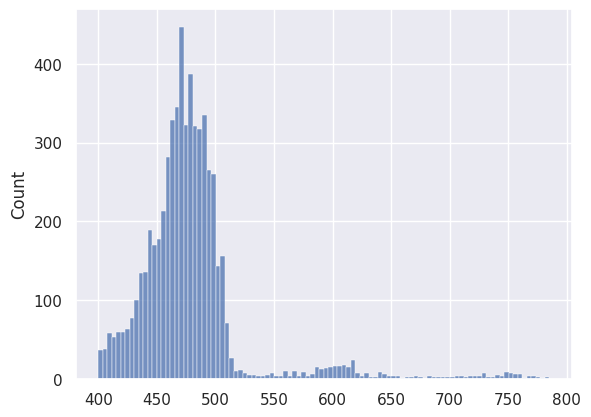

In [20]:
sns.histplot(lens, bins=100)

In [ ]:
embs = []

for path in recur_paths(FOLDER_STROKES_BIN):
    img = np.array(Image.open(path).convert("L"))

    h, w = img.shape

    embs.append(h)

    # if h > 80 or h < 30:
    #     plt.figure(figsize=(5, 1))
    #     plt.imshow(img, cmap="grey")
    #     plt.title(f"{img.shape} {namefile(path)}")
    #     plt.axis(False)
    #     plt.show()

sns.histplot(embs, bins=100)

<Axes: ylabel='Count'>

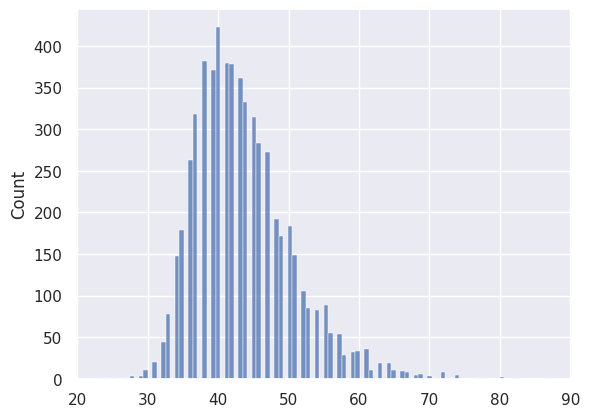

In [24]:
sns.histplot(embs, bins=100)

In [36]:
dir_names = sorted(os.listdir(FOLDER_STROKES_BIN)) # ["000" , "001", ...]

dir2len = defaultdict(int)

for dir in dir_names:
    dir_path = os.path.join(FOLDER_STROKES_BIN, dir)
    dir2len[dir] = len(os.listdir(dir_path))
        

dirlen = sorted([(dir, len) for dir, len in dir2len.items()], key = lambda x: -x[1])
topk_dir2len = dirlen
topk_dir2len = {dir : len for dir, len in topk_dir2len}

# {'Потанина Александра Викторовна': 1409,
#  'Фарафонтова Таисия Михайловна': 938,
#  'Ивановский Алексей Осипович': 798}

topk_dir2len

{'Потанина Александра Викторовна': 1348,
 'Вагнер (Дзвонкевич) Екатерина Николаевна': 665,
 'Фарафонтова Таисия Михайловна': 641,
 'Ивановский Алексей Осипович': 610,
 'Крутовский Владимир Михайлович': 586,
 'Антонова Валентина Константиновна': 508,
 'Семидалов Вениамин Иванович': 459,
 'Проскурякова Е. Павловна': 456,
 'Свентицкая Мария Хрисанфовна': 361,
 'Неустановленное лицо': 343}

In [4]:
FOLDER_from = "КККМfolder10_strokes_bin"
FOLDER_to = "КККМfolder3_strokes_bin"

topk_dir2len = ['Потанина Александра Викторовна',
                'Фарафонтова Таисия Михайловна',
                'Ивановский Алексей Осипович']

!rm -r "$FOLDER_to"
!mkdir "$FOLDER_to"

for dir in topk_dir2len:
    path = os.path.join(FOLDER_from, dir)
    new_path = os.path.join(FOLDER_to, dir)
    !cp -r "{path}" "{new_path}"

In [8]:
dir_names = sorted(os.listdir(FOLDER_to)) # ["000" , "001", ...]

dir2len = defaultdict(int)

for dir in dir_names:
    dir_path = os.path.join(FOLDER_to, dir)
    dir2len[dir] = len(os.listdir(dir_path))
        

dirlen = sorted([(dir, len) for dir, len in dir2len.items()], key = lambda x: -x[1])
topk_dir2len = dirlen
topk_dir2len = {dir : len for dir, len in topk_dir2len}

# {'Потанина Александра Викторовна': 1348,
#  'Фарафонтова Таисия Михайловна': 641,
#  'Ивановский Алексей Осипович': 610}
topk_dir2len

{'Потанина Александра Викторовна': 647,
 'Фарафонтова Таисия Михайловна': 641,
 'Ивановский Алексей Осипович': 610}

In [6]:
l = 0
for i in range(100):
    l += random.random() > 0.5

l / 100

0.57

  0%|                                                  | 0/1348 [00:00<?, ?it/s]

100%|███████████████████████████████████████| 1348/1348 [01:52<00:00, 11.97it/s]


647


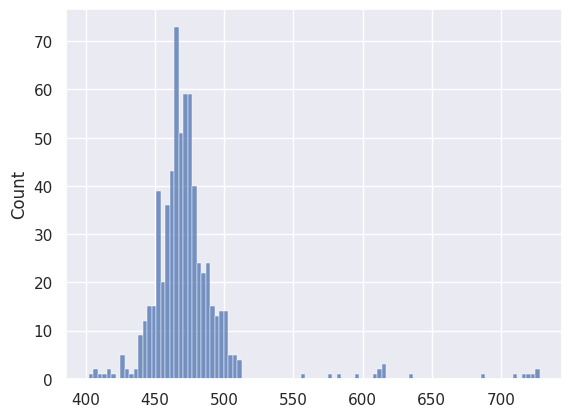

In [7]:
lens = []

for path in tqdm(recur_paths(os.path.join(FOLDER_to, 'Потанина Александра Викторовна'))):
    img = np.array(Image.open(path).convert("L"))

    h, w = img.shape

    if random.random() > 0.5:
        !rm "{path}"
        continue

    lens.append(w)

sns.histplot(lens, bins=100)
print(len(lens))

In [7]:
img.shape

(37, 177)

 10%|███▉                                  | 194/1898 [00:00<00:00, 1927.03it/s]

100%|█████████████████████████████████████| 1898/1898 [00:00<00:00, 2121.28it/s]


<Axes: ylabel='Count'>

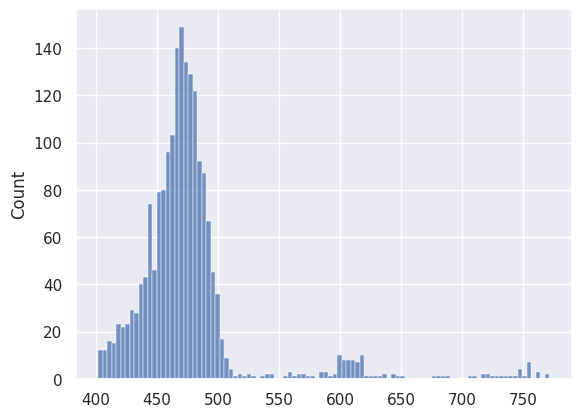

In [9]:
lens = []

for path in tqdm(recur_paths(FOLDER_to)):
    img = np.array(Image.open(path).convert("L"))

    h, w = img.shape

    lens.append(w)

sns.histplot(lens, bins=100)

(<Axes: ylabel='Count'>, np.float64(44.62644889357218))

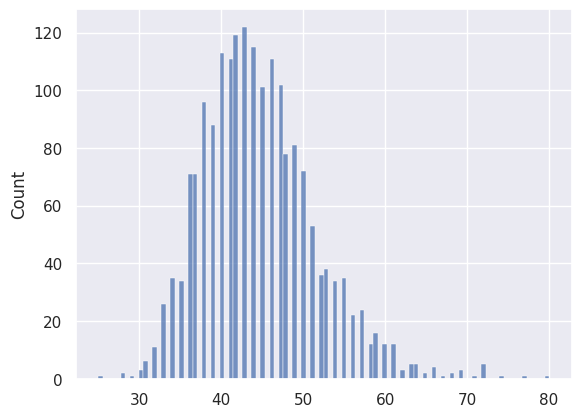

In [11]:
embs = []

for path in recur_paths(FOLDER_to):
    img = np.array(Image.open(path).convert("L"))

    h, w = img.shape

    embs.append(h)

sns.histplot(embs, bins=100), np.mean(embs)

  0%|                                                  | 0/1898 [00:00<?, ?it/s]

  4%|█▌                                      | 73/1898 [00:00<00:07, 241.07it/s]

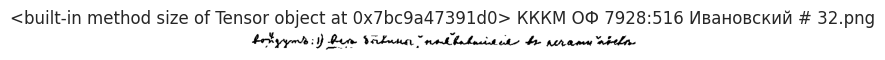

  5%|██                                      | 99/1898 [00:00<00:09, 199.22it/s]

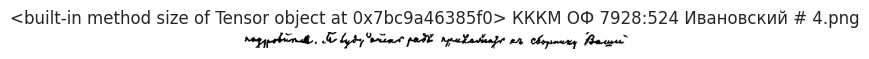

  6%|██▍                                    | 121/1898 [00:00<00:09, 178.23it/s]

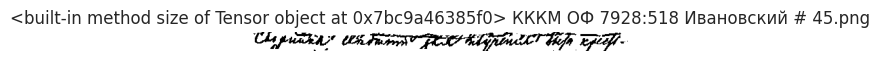

  7%|██▉                                    | 140/1898 [00:00<00:10, 165.16it/s]

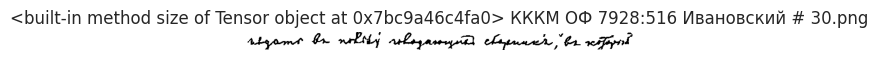

  8%|███▏                                   | 158/1898 [00:00<00:11, 152.85it/s]

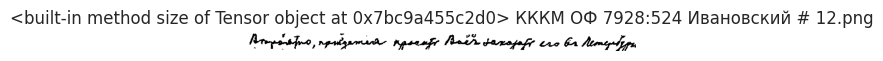

 10%|███▊                                   | 183/1898 [00:01<00:10, 156.85it/s]

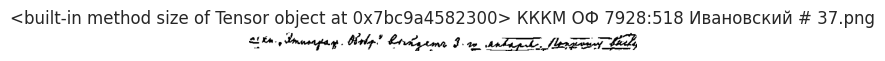

 11%|████▏                                  | 205/1898 [00:01<00:11, 150.62it/s]

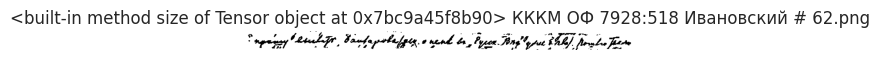

 17%|██████▊                                | 329/1898 [00:01<00:06, 240.35it/s]

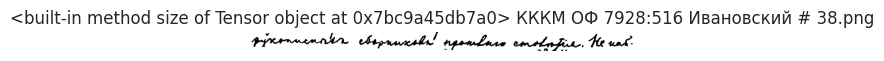

 23%|████████▊                              | 429/1898 [00:02<00:04, 309.86it/s]

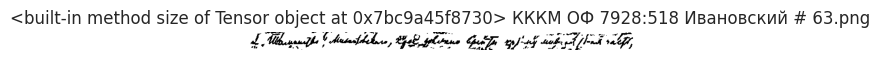

 25%|█████████▌                             | 466/1898 [00:02<00:05, 273.13it/s]

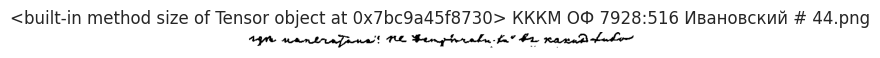

 28%|██████████▊                            | 526/1898 [00:02<00:06, 200.90it/s]

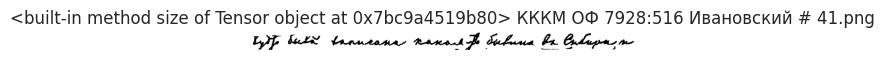

100%|██████████████████████████████████████| 1898/1898 [00:04<00:00, 389.89it/s]


<Axes: ylabel='Count'>

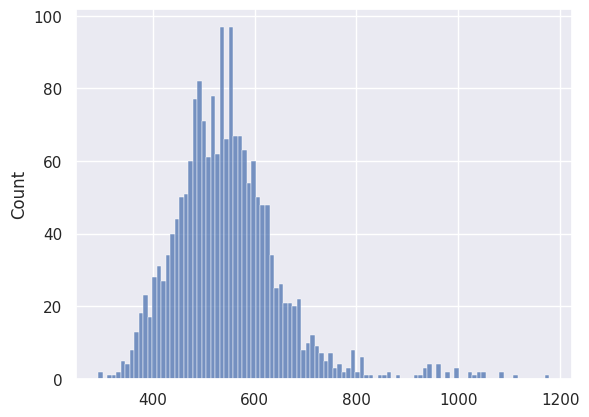

In [20]:
lens = []

def fun(tensor, size=50):
    c, h, w = tensor.shape
    new_h = size
    new_w = int(w * new_h / h)

    res = transforms.Resize((new_h, new_w))(tensor)
    return res


for path in tqdm(recur_paths(FOLDER_to)):
    img_pil = Image.open(path).convert("RGB")
    # print(img.shape)
    img = transforms.functional.pil_to_tensor(img_pil)
    # print(img.shape)
    

    img = fun(img)
    # print(img.shape)

    c, h, w = img.shape

    if w > 1000:
        plt.figure(figsize=(5, 1))
        plt.imshow(img_pil, cmap="grey")
        plt.title(f"{img.size} {namefile(path)}")
        plt.axis(False)
        plt.show()

    lens.append(w)

sns.histplot(lens, bins=100)

# Обрезка изображений

In [ ]:
FOLDER_STROKES_BIN= "КККМfolder10_strokes_bin"
FOLDER_LINES_BIN= "КККМfolder10_bin"

!rm -r "$FOLDER_STROKES_BIN"
!rm -r "$FOLDER_LINES_BIN"

!unzip "{FOLDER_STROKES_BIN}.zip" -d "."
!unzip "{FOLDER_LINES_BIN}.zip" -d "."